# Возможное влияние локальных бегущих волн на скорость реакции испытуемых 
## Possible influence of local traveling waves on the reaction speed of subjects (PILTWRSS)

## Эксперимент: 
1. Испытуемый слушал отдельные слова в виде 8 прилагательных связанных семантическим смыслом 
и выровненых по длительности звучания (3 серии 600,700,900 мс, 10 повторов для каждого 
оригинального слова, т.е. 80 слов в каждой серии, все слова перемешаны в псевдослучайном порядке, 
два одинаковых слова никогда не следовали друг за другом) и величине звукового давления порядка 60 дб.
2. После начала звучания слова испытуемый нажимал на кнопку пульта указательным пальцем правой руки.
3. Испытуемому записывали МЭГ в течении всего эксперимента.
4. В экспериметах участвовали 24 здоровых испытуемых (17 женщин и 7 мужчин) со средним возрастом 27.2 года mean=27.1787 std=4.6422

## Обработка данных
1. Строили распределения реакций испытуемых от начала звучания слова до момента нажатия на кнопку пульта.
3. Анализироровали нормальность распределений времени реакции для каждого испытуемого и для группы 
4. Удаляли выбросы методом межквартильного размаха (IQR)
5. Подсчитывали длительность (в мс) детектирования локальных поверхносных бегущих волн в бороздах коры 
головного мозга методом оценки фазовой задержки медленных волн (альфа-дипазон). 
5. Вычисляли корреляцию Пирсона между скоростью реакции и длительностью бегущих волн:
   а) общей длителительностью TW для всех каналов для каждого испытуемого и для группы
   б) общей длителительностью TW для каждого канала (триплета) для каждого испытуемого
   г) предстимульной (250 мс) длителительностью TW для каждого канала (триплета) для каждого испытуемого
   д) постстимульной (750 мс) длителительностью TW для каждого канала (триплета) для каждого испытуемого
   е) 5 постстимульных интервалов (по 250 мс) длителительностью TW для каждого канала (триплета) для каждого испытуемого

### Функция визуализации времени реакции для всех испытуемых  

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy.io import loadmat

def SubBox(df,titleplt,saveplt):
    # Подавление FutureWarnings
    warnings.filterwarnings("ignore", category=FutureWarning)
    # Генерация данных
    """
    np.random.seed(42)
    data = []
    n_points = 80  # Уменьшено до 80 точек
    for group in range(1, 25):
        mu = np.random.uniform(5, 20)
        sigma = np.random.uniform(1, 5)
        values = np.random.normal(mu, sigma, n_points)  
        data.extend([{'Group': f'Group {group}', 'Value': v} for v in values])
    df = pd.DataFrame(data)
    """
    # Настройка графики
    plt.figure(figsize=(22, 10))
    sns.set_style("whitegrid")
    # Боксплот с кастомизацией
    ax = sns.boxplot(
        x='Sub',
        y='Value',
        data=df,
        whis=[0, 100],
        color='skyblue',
        width=0.7,
        flierprops={'marker': 'x', 'markersize': 8}
    )
    # Overlay точек
    sns.stripplot(
        x='Sub',
        y='Value',
        data=df,
        color='black',
        alpha=0.5,
        jitter=0.25,
        size=3,
        edgecolor='gray',
        linewidth=0.5
    )
    # Аннотации статистики
    for i, group in enumerate(df['Sub'].unique()):
        group_data = df[df['Sub'] == group]['Value']
        mean = group_data.mean()
        std = group_data.std()
        # Линия среднего
        ax.hlines(
            y=mean,
            xmin=i-0.35,
            xmax=i+0.35,
            color='firebrick',
            linewidth=2.5,
            zorder=10
        )
        # STD область
        ax.fill_betweenx(
            y=[mean - std, mean + std],
            x1=i-0.35,
            x2=i+0.35,
            color='limegreen',
            alpha=0.15
        )
    # Визуальная настройка
    plt.title(titleplt, fontsize=28, pad=18)
    plt.xlabel('', fontsize=28)
    #plt.ylabel('Время реакции в сек.', fontsize=28)
    plt.ylabel('Response time in seconds', fontsize=28)
    plt.xticks(rotation=55, fontsize=20)
    plt.yticks(fontsize=20)
    plt.grid(True, alpha=0.4)
    # Кастомная легенда
    leg_elements = [
     #   plt.Line2D([0], [0], color='firebrick', lw=2, markersize=7, label='Среднее'),
        plt.Line2D([0], [0], color='firebrick', lw=2, markersize=7, label='Average'),
        plt.Rectangle((0,0), 1, 1, color='limegreen', alpha=0.2, label='±1 STD'),
        plt.Rectangle((0,0), 1, 1, color='skyblue', alpha=0.2, label='IQR=Q3-Q1'),
        plt.Line2D([], [], color='black', marker='o', linestyle='', 
     #         markersize=4, alpha=0.5, label='Единичное измерение')
        markersize=4, alpha=0.5, label='Single measurement')
    ]
    plt.legend(
        handles=leg_elements, 
        #loc='upper right', 
        loc='lower right',
        frameon=False, #True,
        fontsize=20,  # Основной размер текста
        #title='Легенда',  # Опционально: заголовок
        #title_fontsize=14  # Размер заголовка
    )
    plt.tight_layout()
    plt.savefig(saveplt)
    plt.show()

### Функция удаления выбросов

In [3]:
# 1. Межквартильный размах (IQR)
# Критерий: Значения за пределами Q1 - 1.5*IQR и Q3 + 1.5*IQR
# Применение: Универсальный метод для любых распределений

# import numpy as np

def remove_outliers_iqr(data, column):
    q1 = data[column].quantile(0.25)
    q3 = data[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

# Пример использования
# import pandas as pd
"""
df = pd.DataFrame({'values': data}) #np.random.normal(100, 20, 1000)})
df_clean = remove_outliers_iqr(df, 'values') # убираем выбросы 
datc=np.squeeze(df_clean.values) # раскрываем скобки
"""

"\ndf = pd.DataFrame({'values': data}) #np.random.normal(100, 20, 1000)})\ndf_clean = remove_outliers_iqr(df, 'values') # убираем выбросы \ndatc=np.squeeze(df_clean.values) # раскрываем скобки\n"

### До удаления выбросов 1 серия предъявлений

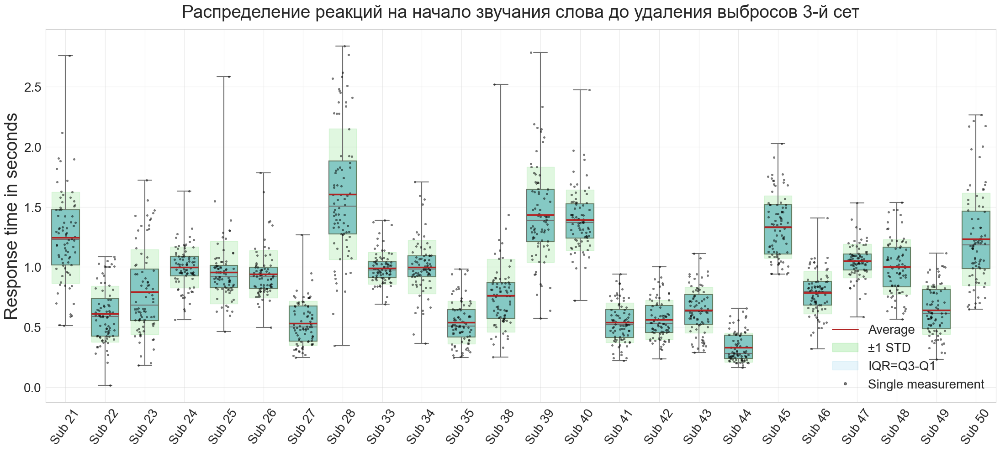

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy.io import loadmat

sb=[21,22,23,24,25,26,27,28,33,34,35,38,39,40,41,42,43,44,45,46,47,48,49,50]

#np.random.seed(42)
data = []
# n_points = 80  # Уменьшено до 80 точек
sr=3 # set
for sub in range(len(sb)):
    #mu = np.random.uniform(5, 20)
    #sigma = np.random.uniform(1, 5)
    #values = np.random.normal(mu, sigma, n_points)
    nameR='data/phRw/phRw' + str(sb[sub]) + '_' + str(sr) + '.mat'
    x=loadmat(nameR)['phiRw']    
    values=np.squeeze(x)   # убираем скобки
    #data.extend([{'Sub': f'Sub {sub+1}', 'Value': v} for v in values]) # Subjects 
    data.extend([{'Sub': f'Sub {sb[sub]}', 'Value': v} for v in values]) # Subjects
df = pd.DataFrame(data)
titlplt='Распределение реакций на начало звучания слова до удаления выбросов '+str(sr)+'-й сет'
saveplt='data/fig/dist/db'+str(sr)+'.png'
SubBox(df,titlplt,saveplt)

### До удаления выбросов 3 серии предъявлений

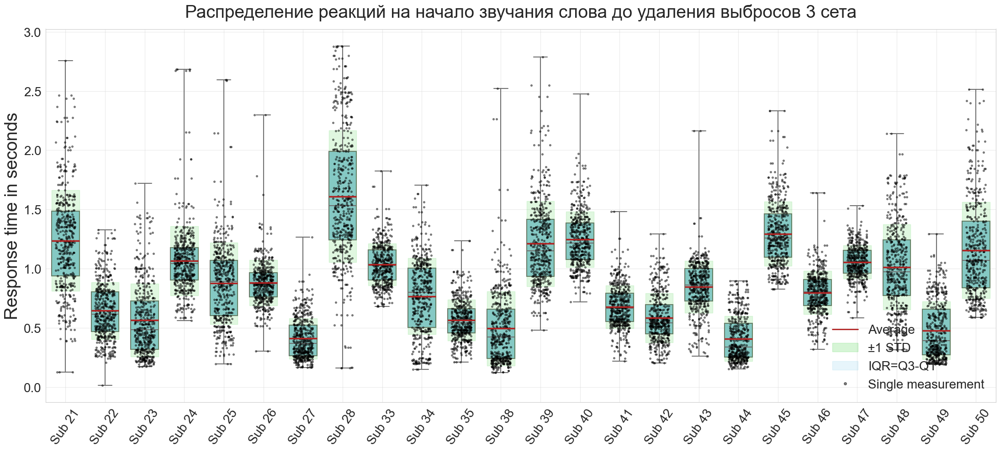

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy.io import loadmat

sb=[21,22,23,24,25,26,27,28,33,34,35,38,39,40,41,42,43,44,45,46,47,48,49,50]

data = []
for sub in range(len(sb)):
    combined_xx = np.array([])  # Пустой массив для результата
    for sr in range(3):
        sr=sr+1
        nameR = f'data/phRw/phRw{sb[sub]}_{sr}.mat'
        #nameR='data/phRw/phRw' + str(sb[i]) + '_' + str(sr) + '.mat'
        x=loadmat(nameR)['phiRw']
        xx = np.squeeze(x).ravel() # Гарантированно в одномерный 
        combined_xx = np.concatenate((combined_xx, xx)) # последовательно объединяем вектора    
        data.extend([{'Sub': f'Sub {sb[sub]}', 'Value': v} for v in combined_xx]) # Subjects     
df = pd.DataFrame(data)
#df_clean = remove_outliers_iqr(df, 'values') # убираем выбросы 
titlplt='Распределение реакций на начало звучания слова до удаления выбросов 3 сета'
saveplt='data/fig/dist/da'+str(sr)+'.png'
SubBox(df,titlplt,saveplt)

### После удаления выбросов одиночный выбранный сет

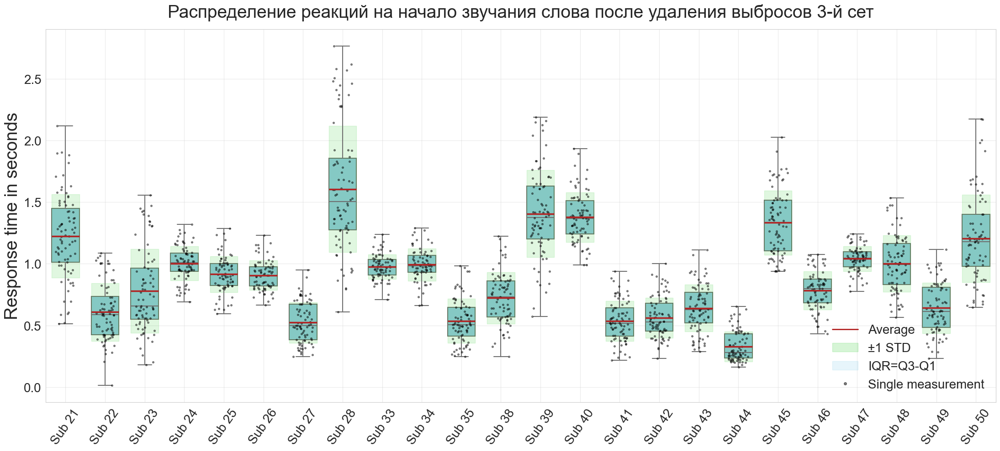

In [6]:
sb=[21,22,23,24,25,26,27,28,33,34,35,38,39,40,41,42,43,44,45,46,47,48,49,50]

#np.random.seed(42)
data = []
# n_points = 80  # Уменьшено до 80 точек
sr=3 # Set
for sub in range(len(sb)):
    #mu = np.random.uniform(5, 20)
    #sigma = np.random.uniform(1, 5)
    #values = np.random.normal(mu, sigma, n_points)
    nameR='data/phRw/phRw' + str(sb[sub]) + '_' + str(sr) + '.mat'
    x=loadmat(nameR)['phiRw']    
    values=np.squeeze(x)   # убираем скобки
    df = pd.DataFrame({'values': values})
    df_clean = remove_outliers_iqr(df, 'values') # убираем выбросы 
    values=np.squeeze(df_clean) # раскрываем скобки
    data.extend([{'Sub': f'Sub {sb[sub]}', 'Value': v} for v in values]) # Subjects
df = pd.DataFrame(data)
titlplt='Распределение реакций на начало звучания слова после удаления выбросов '+str(sr)+'-й сет'
saveplt='data/fig/dist/da'+str(sr)+'.png'
SubBox(df,titlplt,saveplt)

### После удаления выбросов все 3 сета

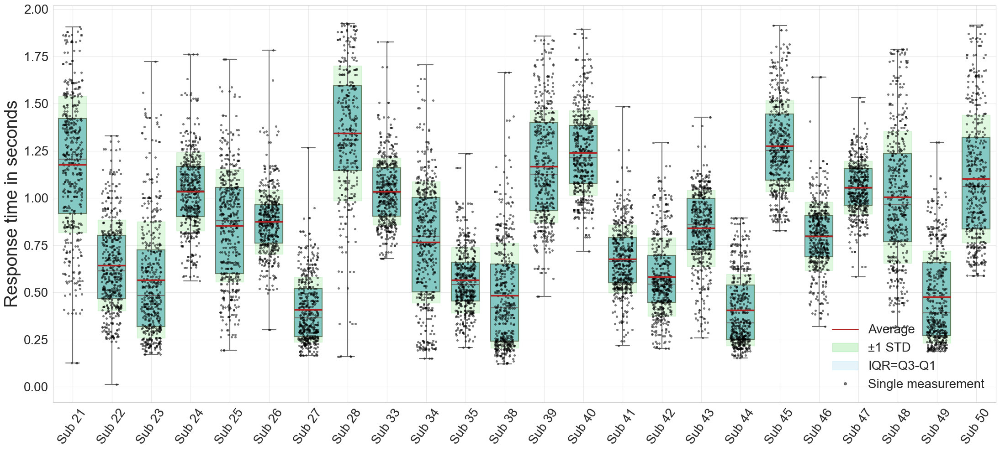

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy.io import loadmat

sb=[21,22,23,24,25,26,27,28,33,34,35,38,39,40,41,42,43,44,45,46,47,48,49,50]

data = []
for sub in range(len(sb)):
    combined_xx = np.array([])  # Пустой массив для результата
    for sr in range(3):
        sr=sr+1
        nameR = f'data/phRw/phRw{sb[sub]}_{sr}.mat'
        #nameR='data/phRw/phRw' + str(sb[i]) + '_' + str(sr) + '.mat'
        x=loadmat(nameR)['phiRw']
        xx = np.squeeze(x).ravel() # Гарантированно в одномерный 
        combined_xx = np.concatenate((combined_xx, xx)) # последовательно объединяем вектора    
        data.extend([{'Sub': f'Sub {sb[sub]}', 'Value': v} for v in combined_xx]) # Subjects     
df = pd.DataFrame(data)
#print(df)
#"""
df_clean = remove_outliers_iqr(df, 'Value') # убираем выбросы 
# titlplt='Распределение реакций на начало звучания слова после удаления выбросов. 3 сета'
#titlplt='Distribution of reactions to the onset of a word after removing outliers (3 sets)'
titlplt=''
saveplt='data/fig/dist/dall.png'
SubBox(df_clean,titlplt,saveplt)
#"""

### Нормальность распределения методом Шапиро-Уилка (Shapiro-Wilk)

#### Функция проверки нормальности распределения

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import shapiro, norm, probplot
from matplotlib import rcParams
from scipy.io import loadmat

# Настройки оформления
rcParams['font.family'] = 'Arial'
plt.style.use('ggplot')

# Генерация тестовых данных
#np.random.seed(42)
#normal_data = np.random.normal(loc=0, scale=1, size=500)
#non_normal_data = np.random.exponential(scale=1, size=500)

def plot_normality_check(data, title):
    # Выполняем тест Шапиро-Уилка
    stat, p_value = shapiro(data)  # Переименовали переменную
    normality = "Нормальное" if p_value > 0.05 else "Не нормальное"
    
    # Создаем график
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    
    # Гистограмма с кривой распределения
    ax[0].hist(data, bins=30, density=True, alpha=0.6, color='steelblue')
    
    # Теоретическая нормальная кривая
    xmin, xmax = ax[0].get_xlim()
    x = np.linspace(xmin, xmax, 100)
    p_normal = norm.pdf(x, np.mean(data), np.std(data))  # Переименовали переменную
    ax[0].plot(x, p_normal, 'k', linewidth=2, label='Нормальное распределение')
    
    # Настройки первого subplot
    ax[0].set_title(f'Распределение данных\n({normality}, p-value: {p_value:.4f})')  # Используем p_value
    ax[0].set_xlabel('Время реакции')
    ax[0].set_ylabel('Плотность')
    ax[0].legend()
    
    # Q-Q plot
    probplot(data, dist="norm", plot=ax[1])
    ax[1].get_lines()[0].set_markerfacecolor('steelblue')
    ax[1].get_lines()[0].set_markersize(5.0)
    ax[1].set_title('Q-Q Plot')
    ax[1].set_xlabel('Теоретические квантили')
    ax[1].set_ylabel('Выборочные квантили')
    
    plt.suptitle(f'Проверка нормальности: {title}', y=1.02, fontsize=14)
    plt.tight_layout()
    plt.savefig('data/fig/norm/n'+str(sb[i])+'_'+str(sr)+'tr'+str(i+1)+'.png')
    plt.show()
"""
# Визуализируем для нормальных данных
plot_normality_check(normal_data, "Нормальное распределение")

# Визуализируем для ненормальных данных
plot_normality_check(non_normal_data, "Экспоненциальное распределение")
"""

'\n# Визуализируем для нормальных данных\nplot_normality_check(normal_data, "Нормальное распределение")\n\n# Визуализируем для ненормальных данных\nplot_normality_check(non_normal_data, "Экспоненциальное распределение")\n'

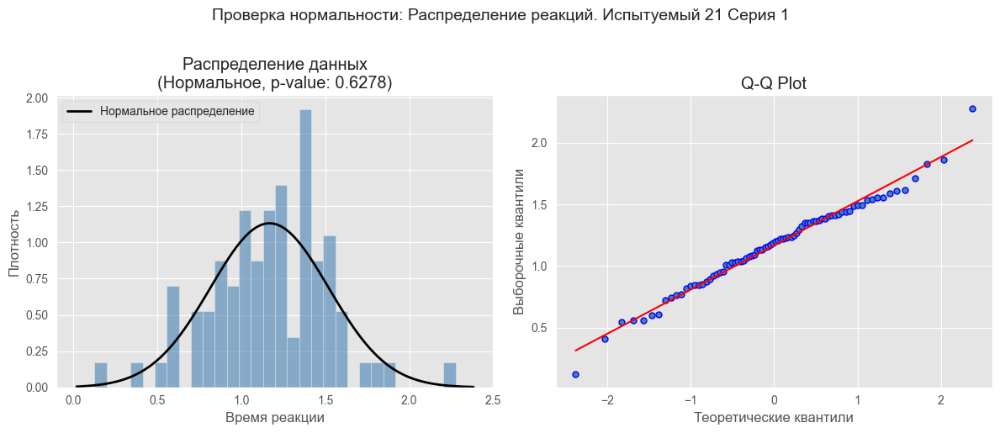

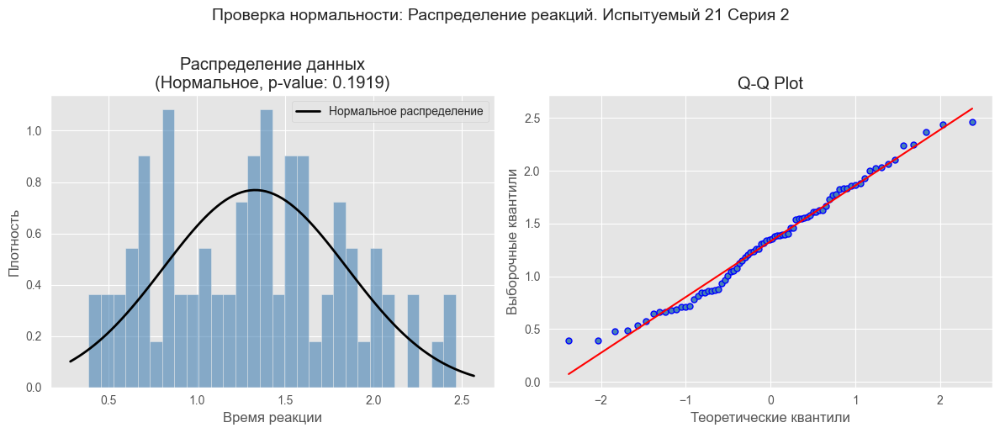

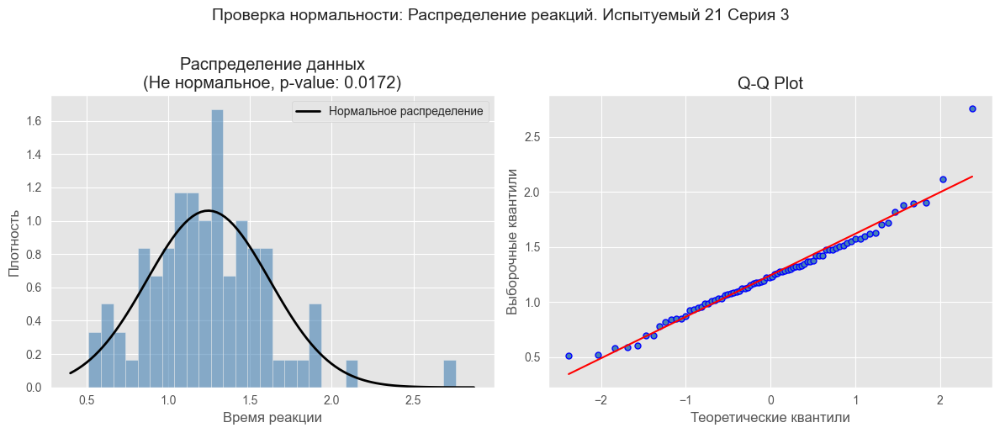

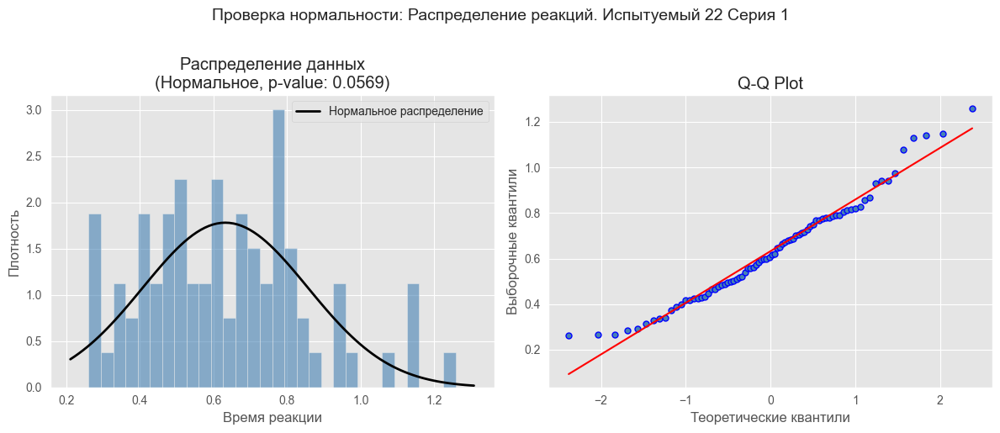

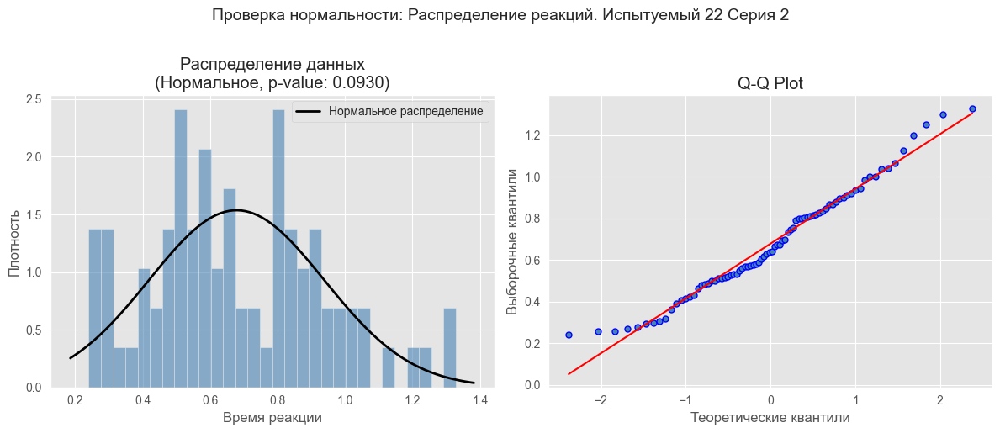

...

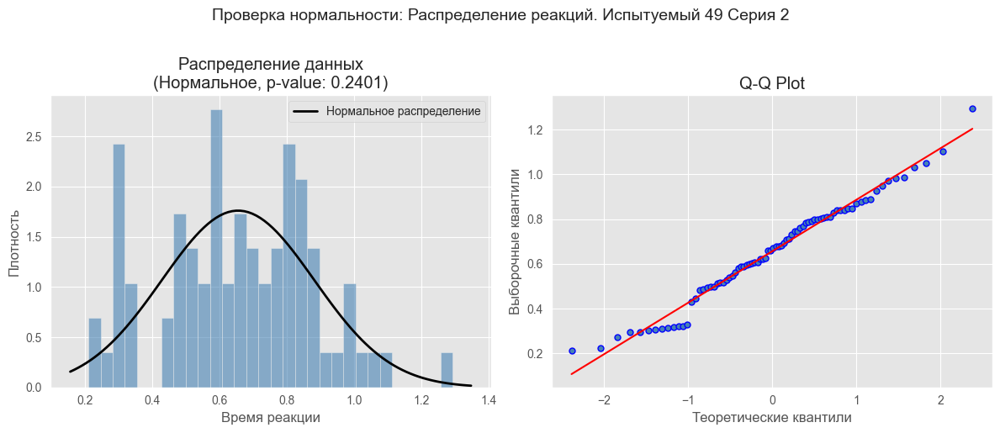

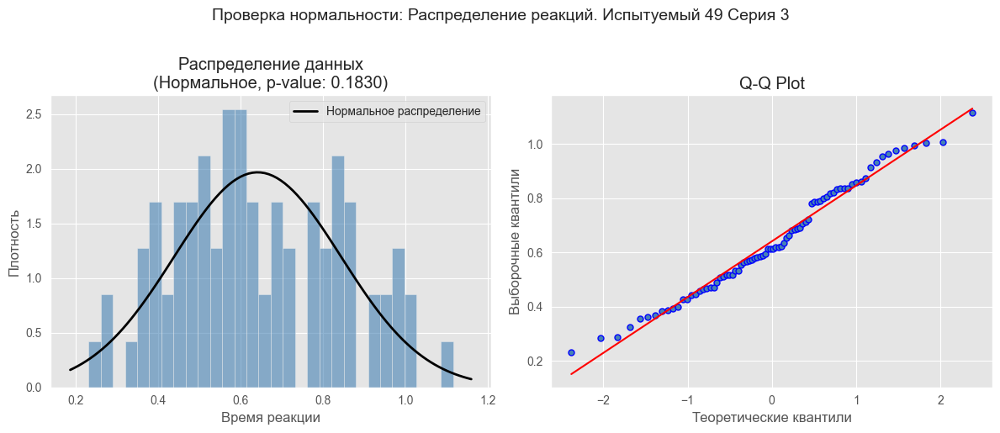

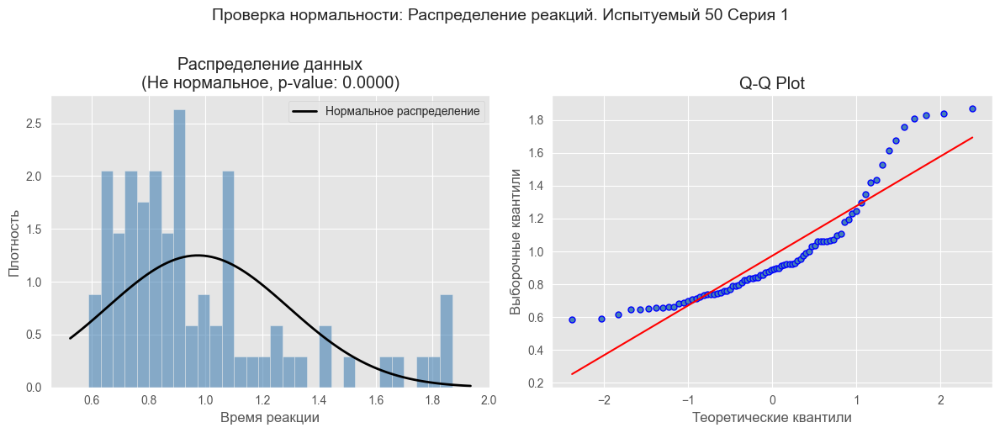

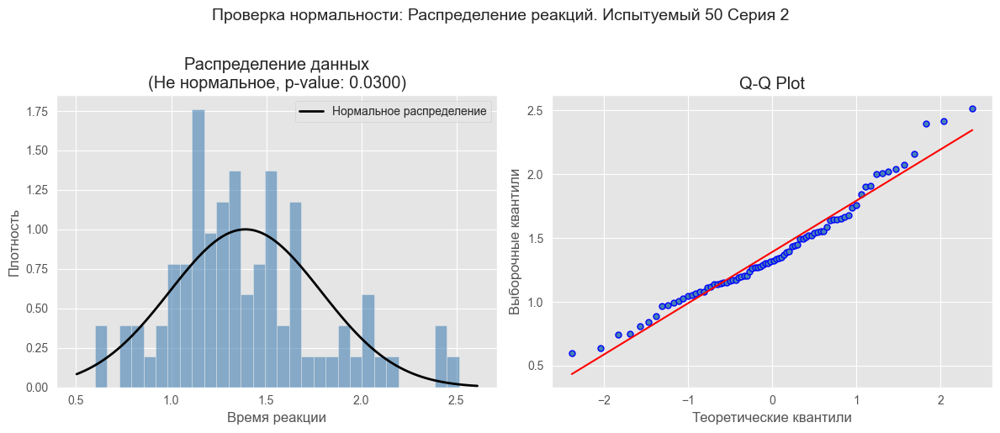

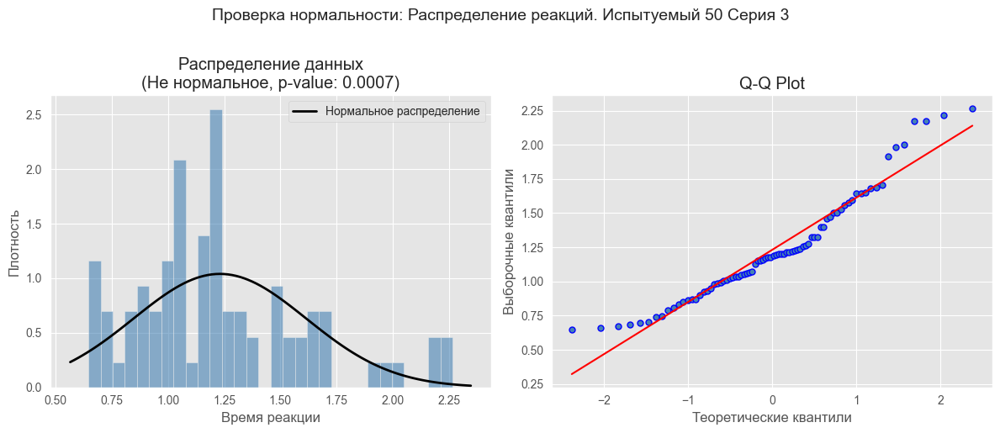

In [9]:
sb=[21,22,23,24,25,26,27,28,33,34,35,38,39,40,41,42,43,44,45,46,47,48,49,50]
# combined_xx = np.array([])  # Пустой массив для результата
for i in range(len(sb)):
    for ii in range(3):
        sr=ii+1
        nameR = f'data/phRw/phRw{sb[i]}_{sr}.mat'
        #nameR='data/phRw/phRw' + str(sb[i]) + '_' + str(sr) + '.mat'
        x=loadmat(nameR)['phiRw']
        xx = np.squeeze(x).ravel() # Гарантированно в одномерный 
        title='Распределение реакций. Испытуемый '+ str(sb[i]) + ' Серия ' + str(sr)
        plot_normality_check(xx, title)
#        combined_xx = np.concatenate((combined_xx, xx)) # последовательно объединяем вектора
#print(len(combined_xx))   
#plot_normality_check(combined_xx, "Распределение реакций до удвления выбросов")
#print(combined_xx) 
# print(data)
#plot_normality_check(data, "Распределение реакций после удаления выбросов")

### Корреляция Пирсона с удалением выбросов по скорости реакции испытуемых

In [10]:
NumTrN=['LT001', 'LF002', 'LT003', 'LT004', 'LT005', 'LT006', 'LT007', 'LT008', 'LF009', 'LF010', 
        'LF011', 'LF012', 'LP013', 'LP014', 'LP015', 'LP016', 'LF017', 'LF018', 'LF019', 'LF020', 
        'LF021', 'ZF022', 'LP023', 'LF024', 'LC025', 'RC026', 'RP027', 'LP028', 'ZF029', 'ZF030', 
        'RF031', 'RF032', 'RF033', 'RF034', 'ZF035', 'RF036', 'RF037', 'RC038', 'RP039', 'RP040', 
        'RP041', 'RP042', 'RF043', 'RF044', 'RF045', 'RF046', 'RT047', 'RT048', 'RT049', 'RT050', 
        'RF051', 'RT052', 'RT053', 'RT054', 'LT055', 'LT056', 'LT057', 'LT058', 'LT059', 'LT060', 
        'LP061', 'LO062', 'LO063', 'LO064', 'LO065', 'LO066', 'LT067', 'LP068', 'LP069', 'LP070', 
        'LO071', 'LO072', 'LO073', 'LO074', 'LP075', 'RP076', 'RO077', 'LO078', 'ZO079', 'ZO080', 
        'RO081', 'LO082', 'RP083', 'RT084', 'RP085', 'RP086', 'RO087', 'RO088', 'RO089', 'RO090', 
        'RT091', 'RT092', 'RO093', 'RT094', 'RO095', 'RO096', 'RO097', 'RO098', 'RT099', 'RT100', 
        'RT101', 'RT102']

### Таблица+анатомия

In [11]:
### Table+anat
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from scipy.io import loadmat

Nchn=102
Nser=3
sb=[21,22,23,24,25,26,27,28,33,34,35,38,39,40,41,42,43,44,45,46,47,48,49,50]
iiii=0
yyyy=np.zeros(Nchn)
iyyyy=np.zeros(Nchn)
for i in range(len(sb)):
    #print(sb[i])
    for ii in range(Nser):
        sr=ii+1
        nameR='data/phRw/phRw' + str(sb[i]) + '_' + str(sr) + '.mat'
        x=loadmat(nameR)['phiRw']
        values=np.squeeze(x)   # убираем скобки
        ####### Убираем выбросы методом IQR ##########################
        df = pd.DataFrame({'values': values})
        df_clean = remove_outliers_iqr(df, 'values') 
        x=values
        xc=np.squeeze(df_clean.values) # раскрываем скобки
        #print(x)     
        #print(xc)
        ##### Находим индексы сохраненных элементов в массивах нумпи #
        indices = []
        for num in xc:
            first_occurrence = np.argmax(x == num) # Ищем первое вхождение num в x
            if x[first_occurrence] == num:  # Проверяем, что элемент действительно найден
                indices.append(first_occurrence)
            else:
                indices.append(-1)
        #print("Индексы с дубликатами:", indices)  # [0, 3, 4, 5, 6]
        nameWp='data/phdp/phdp' + str(sb[i]) + '_' + str(sr) + '.mat'
        y1=loadmat(nameWp)['phdp']
        nameWm='data/phdm/phdm' + str(sb[i]) + '_' + str(sr) + '.mat'
        y2=loadmat(nameWm)['phdm'] # 80*102*1300
        y=y1+y2 # Суммируем время TW для вращений по часовой и против часовой стрелки
        yy = np.zeros((80, Nchn))  # Пустой массив для результатов
        ##############################################################################
        ####################### Задаем интервалы для МЭГ #############################
        ##############################################################################
        starty=250+250  #0         #1000 750  500 250 250  0   0
        stopy=250+250+250 #1300+250   #1300+250   #1250 1000 750 500 1250 250 1300
        for iii in range(Nchn):
            # Берём срез для текущего канала-iii и суммируем по последней оси
            yy[:, iii] = y[:, iii, starty:stopy-1].sum(axis=1)
            #print(yy[:,iii])
            yyy=np.zeros(len(indices))
            for j in range(len(indices)):
                yyy[j]=yy[indices[j],iii]  
            # print(yyy)
            # Вычисление корреляции
            corr_coef, p_value = pearsonr(xc, yyy)
            #print(corr_coef)
            #print(p_value)
            if p_value <= 0.01: 
               iiii=iiii+1 
               iyyyy[iiii-1]=iii 
               yyyy[iiii-1]=corr_coef
               #print(f'{corr_coef:.2f}'+' ') 
               ## №,Subj,seria,triplet,corr_coef,p_value
               ## print(str(iiii)+','+str(sb[i])+','+str(sr)+','+f'{iii+1}'+','+f'{corr_coef:.2f}'+','+f'{p_value:.4f}'+',')  
               # №,triplet,corr_coef,p_value,Subj,seria 
               print(str(iiii)+','+f'{iii+1}'+','+NumTrN[iii]+','+f'{corr_coef:.2f}'+','f'{p_value:.4f}'+','+str(sb[i])+','+str(sr)+',') 
               """ визуализация    
               print(f"Номер триплета: {iii+1}")
               print(f"Коэффициент корреляции Пирсона: {corr_coef:.2f}")
               print(f"p-значение: {p_value:.4f}")
               # Построение графика
               plt.figure(figsize=(10, 6))
               sns.set_style("whitegrid")  # Стиль фона
               # Диаграмма рассеяния с линией регрессии
               #sns.regplot(x=x,y=yy[:,iii],scatter_kws={'alpha':0.6,'color':'blue'},line_kws={'color':'red'})
               sns.regplot(x=xc,y=yyy,scatter_kws={'alpha':0.6,'color':'blue'},line_kws={'color':'red'}) 
               # Настройки графика
               plt.title(f"Корреляция между TW на {iii+1} триплете и временем реакции на услышанное слово у {sb[i]} исп. {sr} серии\nPearson r={corr_coef:.2f}, p={p_value:.4f}", fontsize=10)
               plt.xlabel("Время реакции в мс", fontsize=12)
               plt.ylabel("Общее время TW в мс для триплета", fontsize=10)
               plt.grid(True)
               plt.savefig('data/fig/pm'+str(sb[i])+'_'+str(sr)+'tr'+str(i+1)+'.png')
               plt.show() 
               """
yyyy=yyyy[0:iiii] # Обрезаем значения корреляций
iyyyy=iyyyy[0:iiii] # Обрезаем номера триплетов                 

1,95,RO095,0.31,0.0052,21,2,
2,26,RC026,0.34,0.0025,21,3,
3,56,LT056,0.40,0.0002,21,3,
4,66,LO066,0.33,0.0031,21,3,
5,98,RO098,0.35,0.0018,21,3,
6,26,RC026,-0.37,0.0008,22,2,
7,96,RO096,-0.30,0.0064,22,2,
8,102,RT102,0.29,0.0092,22,3,
9,37,RF037,0.31,0.0056,23,1,
10,39,RP039,0.30,0.0086,23,1,
11,58,LT058,0.31,0.0058,23,2,
12,59,LT059,-0.30,0.0072,23,2,
13,66,LO066,0.31,0.0058,23,3,
14,25,LC025,0.30,0.0082,24,3,
15,78,LO078,0.31,0.0059,24,3,
16,89,RO089,0.31,0.0059,24,3,
17,97,RO097,-0.40,0.0003,24,3,
18,9,LF009,-0.29,0.0079,25,1,
19,74,LO074,-0.40,0.0002,25,1,
20,43,RF043,-0.32,0.0047,25,2,
21,76,RP076,-0.32,0.0049,25,2,
22,93,RO093,0.31,0.0076,25,2,
23,38,RC038,-0.30,0.0094,25,3,
24,66,LO066,0.30,0.0099,25,3,
25,47,RT047,-0.34,0.0037,26,2,
26,100,RT100,0.31,0.0083,26,2,
27,1,LT001,0.35,0.0021,26,3,
28,12,LF012,-0.32,0.0065,27,1,
29,28,LP028,0.33,0.0042,27,1,
30,84,RT084,-0.29,0.0095,27,2,
31,30,ZF030,-0.31,0.0050,27,3,
32,44,RF044,0.32,0.0036,27,3,
33,18,LF018,-0.32,0.0041,33,1,
34,24

In [12]:
### Table
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from scipy.io import loadmat

Nchn=102
Nser=3
sb=[21,22,23,24,25,26,27,28,33,34,35,38,39,40,41,42,43,44,45,46,47,48,49,50]
iiii=0
yyyy=np.zeros(Nchn)
iyyyy=np.zeros(Nchn)
for i in range(len(sb)):
    #print(sb[i])
    for ii in range(Nser):
        sr=ii+1
        nameR='data/phRw/phRw' + str(sb[i]) + '_' + str(sr) + '.mat'
        x=loadmat(nameR)['phiRw']
        values=np.squeeze(x)   # убираем скобки
        ####### Убираем выбросы методом IQR ##########################
        df = pd.DataFrame({'values': values})
        df_clean = remove_outliers_iqr(df, 'values') 
        x=values
        xc=np.squeeze(df_clean.values) # раскрываем скобки
        #print(x)     
        #print(xc)
        ##### Находим индексы сохраненных элементов в массивах нумпи #
        indices = []
        for num in xc:
            first_occurrence = np.argmax(x == num) # Ищем первое вхождение num в x
            if x[first_occurrence] == num:  # Проверяем, что элемент действительно найден
                indices.append(first_occurrence)
            else:
                indices.append(-1)
        #print("Индексы с дубликатами:", indices)  # [0, 3, 4, 5, 6]
        nameWp='data/phdp/phdp' + str(sb[i]) + '_' + str(sr) + '.mat'
        y1=loadmat(nameWp)['phdp']
        nameWm='data/phdm/phdm' + str(sb[i]) + '_' + str(sr) + '.mat'
        y2=loadmat(nameWm)['phdm']
        y=y1+y2 # Суммируем время TW для вращений по часовой и против часовой стрелки
        yy = np.zeros((80, Nchn))  # Пустой массив для результатов
        for iii in range(Nchn):
            # Берём срез для текущего i и суммируем по последней оси
            yy[:, iii] = y[:, iii, :].sum(axis=1)
            #print(yy[:,iii])
            yyy=np.zeros(len(indices))
            for j in range(len(indices)):
                yyy[j]=yy[indices[j],iii]  
            # print(yyy)
            # Вычисление корреляции
            corr_coef, p_value = pearsonr(xc, yyy)
            #print(corr_coef)
            #print(p_value)
            if p_value <= 0.01: 
               iiii=iiii+1 
               iyyyy[iiii-1]=iii 
               yyyy[iiii-1]=corr_coef
               #print(f'{corr_coef:.2f}'+' ') 
               ## №,Subj,seria,triplet,corr_coef,p_value
               ## print(str(iiii)+','+str(sb[i])+','+str(sr)+','+f'{iii+1}'+','+f'{corr_coef:.2f}'+','+f'{p_value:.4f}'+',')  
               # №,triplet,corr_coef,p_value,Subj,seria 
               print(str(iiii)+','+f'{iii+1}'+','+f'{corr_coef:.2f}'+','f'{p_value:.4f}'+','+str(sb[i])+','+str(sr)+',') 
               """ визуализация    
               print(f"Номер триплета: {iii+1}")
               print(f"Коэффициент корреляции Пирсона: {corr_coef:.2f}")
               print(f"p-значение: {p_value:.4f}")
               # Построение графика
               plt.figure(figsize=(10, 6))
               sns.set_style("whitegrid")  # Стиль фона
               # Диаграмма рассеяния с линией регрессии
               #sns.regplot(x=x,y=yy[:,iii],scatter_kws={'alpha':0.6,'color':'blue'},line_kws={'color':'red'})
               sns.regplot(x=xc,y=yyy,scatter_kws={'alpha':0.6,'color':'blue'},line_kws={'color':'red'}) 
               # Настройки графика
               plt.title(f"Корреляция между TW на {iii+1} триплете и временем реакции на услышанное слово у {sb[i]} исп. {sr} серии\nPearson r={corr_coef:.2f}, p={p_value:.4f}", fontsize=10)
               plt.xlabel("Время реакции в мс", fontsize=12)
               plt.ylabel("Общее время TW в мс для триплета", fontsize=10)
               plt.grid(True)
               plt.savefig('data/fig/pm'+str(sb[i])+'_'+str(sr)+'tr'+str(i+1)+'.png')
               plt.show() 
               """
yyyy=yyyy[0:iiii] # Обрезаем значения корреляций
iyyyy=iyyyy[0:iiii] # Обрезаем номера триплетов                 

1,19,-0.32,0.0041,21,3,
2,49,-0.41,0.0002,22,2,
3,72,0.32,0.0040,22,3,
4,4,0.37,0.0007,23,2,
5,42,0.33,0.0035,24,2,
6,62,0.33,0.0033,24,2,
7,84,0.29,0.0095,24,2,
8,1,-0.34,0.0028,24,3,
9,24,-0.32,0.0053,24,3,
10,89,0.33,0.0033,24,3,
11,95,0.30,0.0080,24,3,
12,97,-0.33,0.0035,24,3,
13,39,0.44,0.0000,25,1,
14,41,0.30,0.0062,25,1,
15,42,0.33,0.0032,25,1,
16,74,-0.34,0.0020,25,1,
17,75,0.31,0.0052,25,1,
18,90,0.34,0.0034,25,2,
19,5,-0.32,0.0052,25,3,
20,10,0.47,0.0000,25,3,
21,40,0.30,0.0087,25,3,
22,93,0.34,0.0034,25,3,
23,66,0.32,0.0051,26,2,
24,6,-0.33,0.0044,26,3,
25,69,0.30,0.0095,26,3,
26,28,0.35,0.0028,27,1,
27,57,-0.32,0.0062,27,1,
28,96,0.31,0.0087,27,1,
29,85,0.31,0.0046,27,2,
30,7,-0.29,0.0097,27,3,
31,40,0.30,0.0074,27,3,
32,72,0.31,0.0064,28,1,
33,83,-0.33,0.0030,28,2,
34,74,-0.31,0.0061,28,3,
35,18,-0.40,0.0003,33,1,
36,59,0.36,0.0012,33,1,
37,65,-0.30,0.0094,33,3,
38,16,-0.37,0.0007,34,1,
39,31,-0.36,0.0009,34,1,
40,72,0.29,0.0100,34,1,
41,90,0.33,0.0028,34,1,
42,37,0.33,0.0

## Графики корреляций

Все триплеты
Коэффициент корреляции Пирсона: -0.30
p-значение: 0.0076


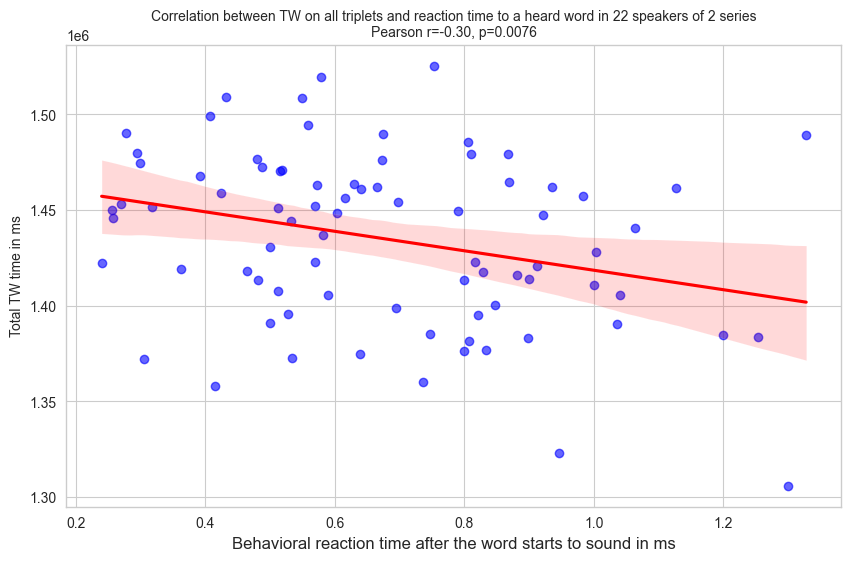

In [13]:
### Show correlation All channels
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from scipy.io import loadmat

Nchn=102
Nser=3
sb=[21,22,23,24,25,26,27,28,33,34,35,38,39,40,41,42,43,44,45,46,47,48,49,50]
iiii=0
yyyy=np.zeros(Nchn)
iyyyy=np.zeros(Nchn)
for i in range(len(sb)):
    #print(sb[i])
    for ii in range(3):
        sr=ii+1
        nameR='data/phRw/phRw' + str(sb[i]) + '_' + str(sr) + '.mat'
        x=loadmat(nameR)['phiRw']
        values=np.squeeze(x)   # убираем скобки
        ####### Убираем выбросы методом IQR ##########################
        df = pd.DataFrame({'values': values})
        df_clean = remove_outliers_iqr(df, 'values') 
        x=values
        xc=np.squeeze(df_clean.values) # раскрываем скобки
        ##### Находим индексы сохраненных элементов в массивах нумпи #
        indices = []
        for num in xc:
            first_occurrence = np.argmax(x == num) # Ищем первое вхождение num в x
            if x[first_occurrence] == num:  # Проверяем, что элемент действительно найден
                indices.append(first_occurrence)
            else:
                indices.append(-1)
        #print("Индексы с дубликатами:", indices)  # [0, 3, 4, 5, 6]
        nameWp='data/phdp/phdp' + str(sb[i]) + '_' + str(sr) + '.mat'
        y1=loadmat(nameWp)['phdp']
        nameWm='data/phdm/phdm' + str(sb[i]) + '_' + str(sr) + '.mat'
        y2=loadmat(nameWm)['phdm']
        y=y1+y2
        yy = np.zeros((80, Nchn))  # Пустой массив для результатов
        yyy= np.zeros((len(indices),Nchn))
        for iii in range(Nchn):
            # Берём срез для текущего iii и суммируем по последней оси
            yy[:, iii] = y[:, iii, :].sum(axis=1)
            # print(len(indices))
            for j in range(len(indices)):
                yyy[j,iii]=yy[indices[j],iii]  # Выбираем данные по индексам с удаленными выбросами   
        yyy= yyy.sum(axis=1)
        #print(len(xc))
        # print(len(yy))    
        # """
        # Вычисление корреляции
        corr_coef, p_value = pearsonr(xc, yyy)
        #iiii=iiii+1 
        iyyyy[iiii-1]=iii 
        yyyy[iiii-1]=corr_coef
        #print(str(iiii)+','+str(sb[i])+','+str(sr)+','+f'{iii+1}'+','+f'{corr_coef:.2f}'+','+f'{p_value:.4f}')  
        # №,Subj,seria,triplet,corr_coef,p_value
        # визуализация   
        if p_value < 0.01: 
            print(f"Все триплеты")
            print(f"Коэффициент корреляции Пирсона: {corr_coef:.2f}")
            print(f"p-значение: {p_value:.4f}")
            # Построение графика
            plt.figure(figsize=(10, 6))
            sns.set_style("whitegrid")  # Стиль фона
            # Диаграмма рассеяния с линией регрессии
            #sns.regplot(x=x,y=yy[:,iii],scatter_kws={'alpha':0.6,'color':'blue'},line_kws={'color':'red'})
            sns.regplot(x=xc,y=yyy,scatter_kws={'alpha':0.6,'color':'blue'},line_kws={'color':'red'}) 
            # Настройки графика
            # plt.title(f"Корреляция между TW на всех триплетах и временем реакции на услышанное слово у {sb[i]} исп. {sr} серии\nPearson r={corr_coef:.2f}, p={p_value:.4f}", fontsize=10)
            plt.title(f"Correlation between TW on all triplets and reaction time to a heard word in {sb[i]} speakers of {sr} series\nPearson r={corr_coef:.2f}, p={p_value:.4f}", fontsize=10)
            #plt.xlabel("Время реакции в мс", fontsize=12)
            plt.xlabel("Behavioral reaction time after the word starts to sound in ms", fontsize=12) 
            # plt.ylabel("Общее время TW в мс для триплета", fontsize=10)
            plt.ylabel("Total TW time in ms", fontsize=10) 
            plt.grid(True)
            plt.savefig('data/fig/corr/c'+str(sb[i])+'_'+str(sr)+'trAll'+'.png')
            plt.show() 
        #"""
#yyyy=yyyy[0:iiii] # Обрезаем значения корреляций
#iyyyy=iyyyy[0:iiii] # Обрезаем номера триплетов                   

Номер триплета: 19
Испытуемый: 21
Серия: 3
Коэффициент корреляции Пирсона: -0.32
p-значение: 0.0041


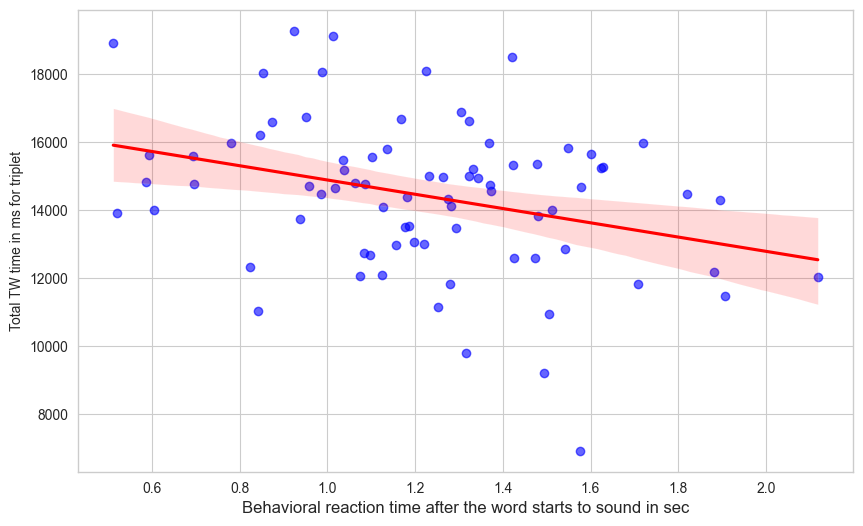

Номер триплета: 49
Испытуемый: 22
Серия: 2
Коэффициент корреляции Пирсона: -0.41
p-значение: 0.0002


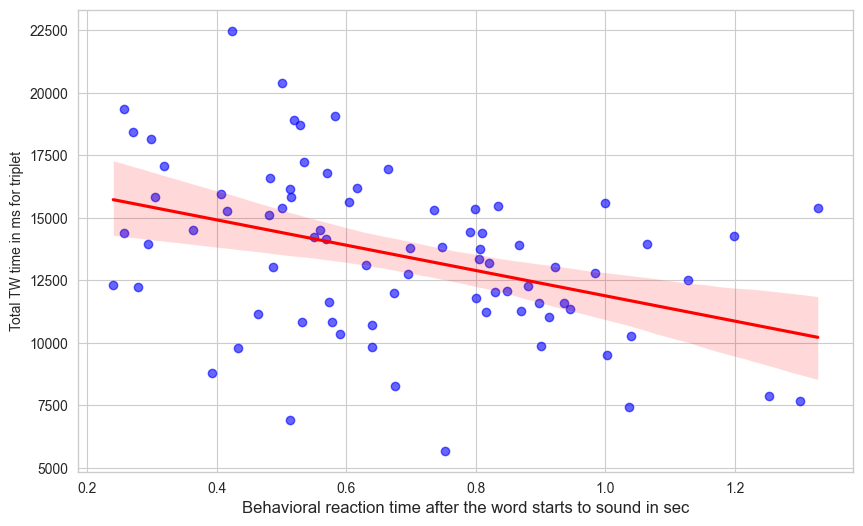

Номер триплета: 72
Испытуемый: 22
Серия: 3
Коэффициент корреляции Пирсона: 0.32
p-значение: 0.0040


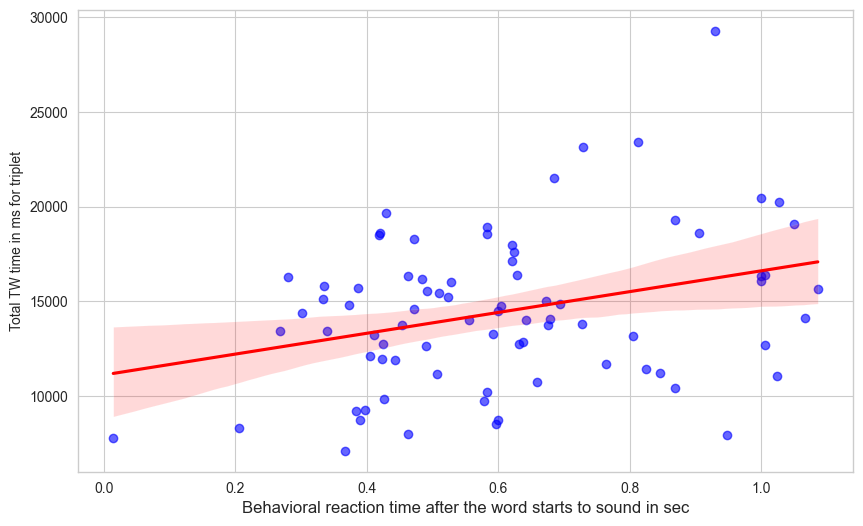

Номер триплета: 4
Испытуемый: 23
Серия: 2
Коэффициент корреляции Пирсона: 0.37
p-значение: 0.0007


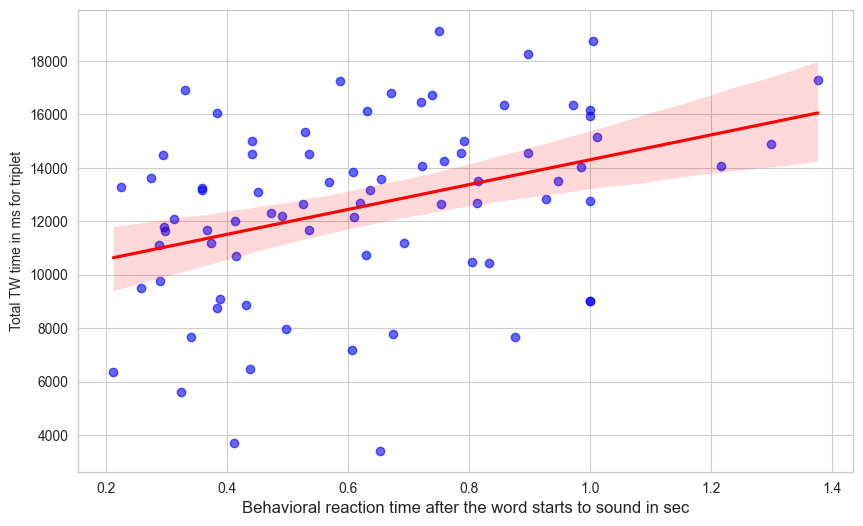

Номер триплета: 42
Испытуемый: 24
Серия: 2
Коэффициент корреляции Пирсона: 0.33
p-значение: 0.0035


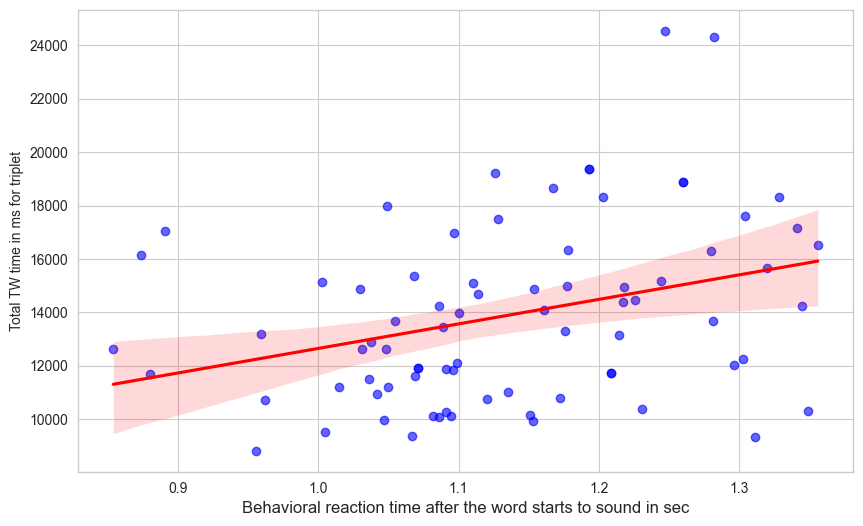

Номер триплета: 62
Испытуемый: 24
Серия: 2
Коэффициент корреляции Пирсона: 0.33
p-значение: 0.0033


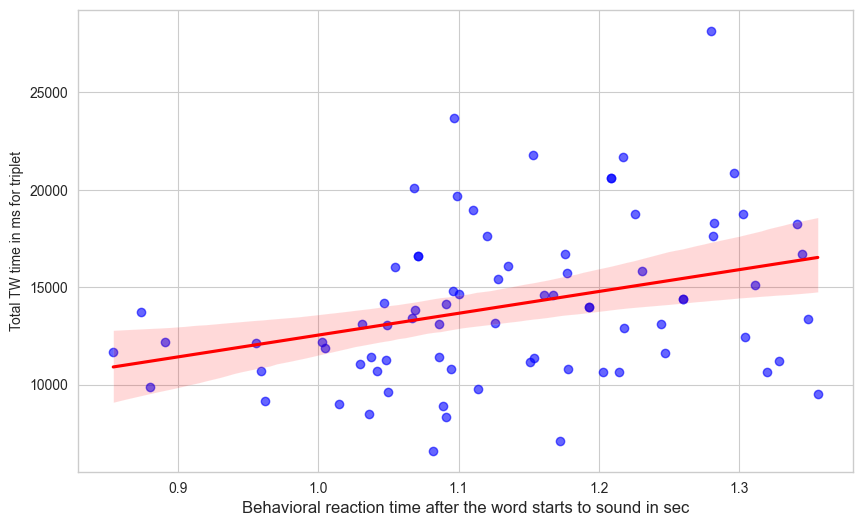

Номер триплета: 84
Испытуемый: 24
Серия: 2
Коэффициент корреляции Пирсона: 0.29
p-значение: 0.0095


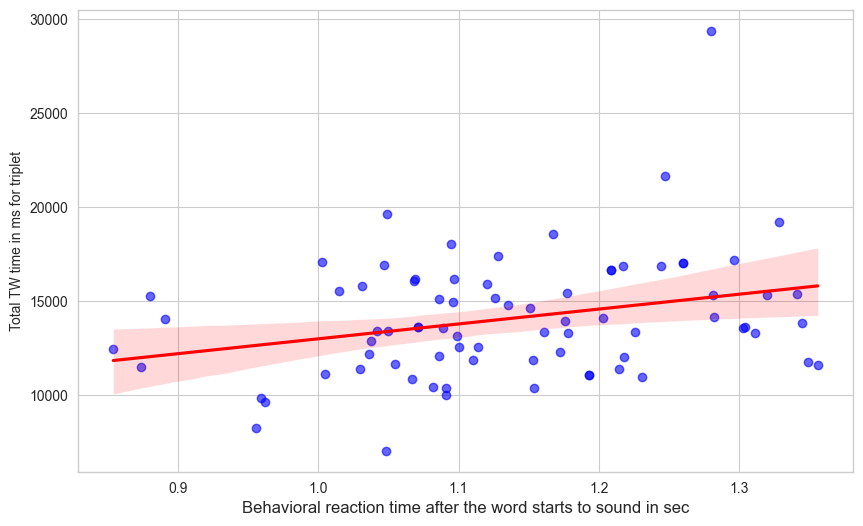

Номер триплета: 1
Испытуемый: 24
Серия: 3
Коэффициент корреляции Пирсона: -0.34
p-значение: 0.0028


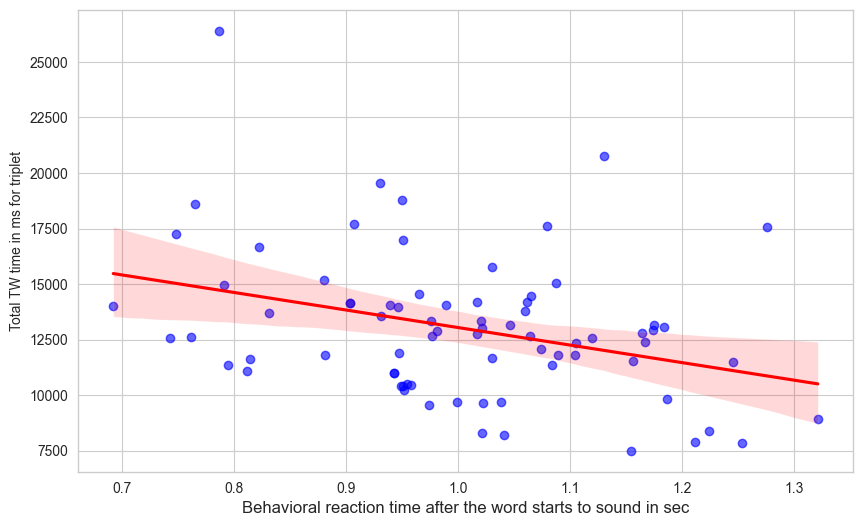

Номер триплета: 24
Испытуемый: 24
Серия: 3
Коэффициент корреляции Пирсона: -0.32
p-значение: 0.0053


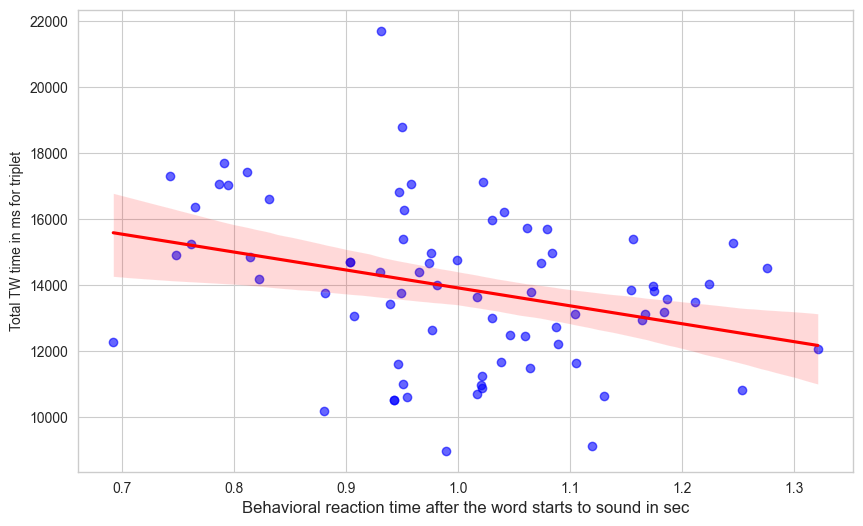

Номер триплета: 89
Испытуемый: 24
Серия: 3
Коэффициент корреляции Пирсона: 0.33
p-значение: 0.0033


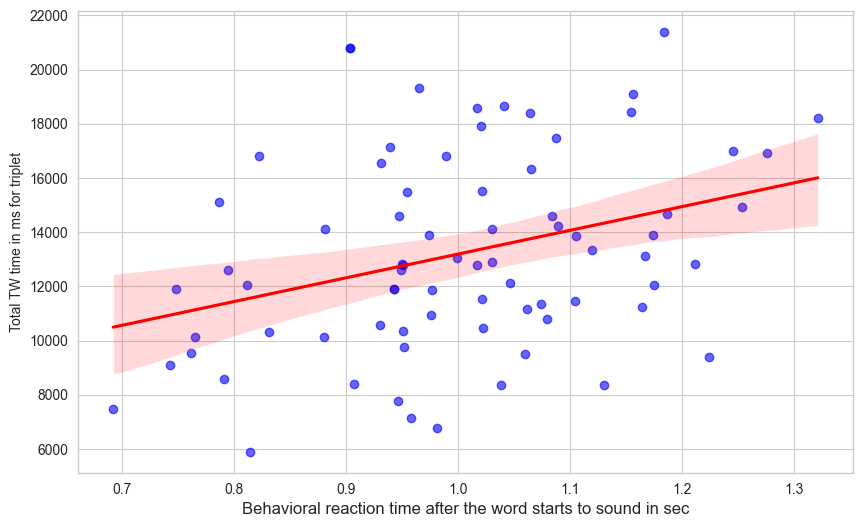

Номер триплета: 95
Испытуемый: 24
Серия: 3
Коэффициент корреляции Пирсона: 0.30
p-значение: 0.0080


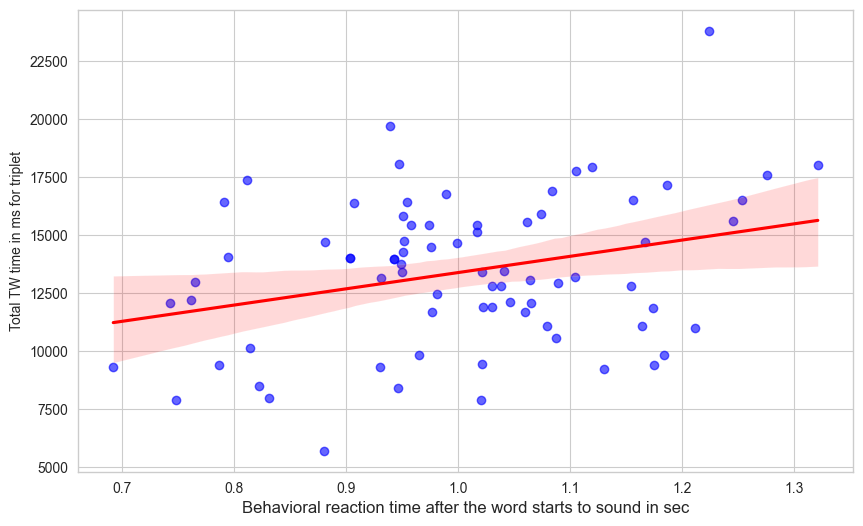

Номер триплета: 97
Испытуемый: 24
Серия: 3
Коэффициент корреляции Пирсона: -0.33
p-значение: 0.0035


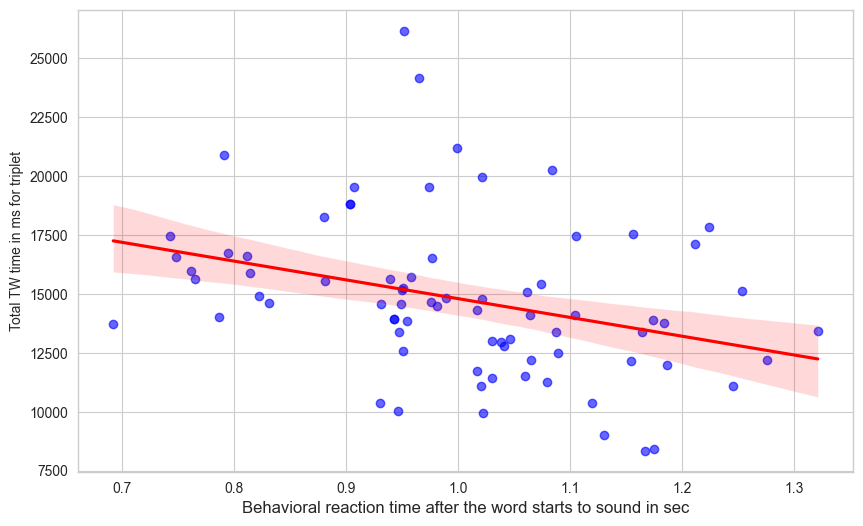

Номер триплета: 39
Испытуемый: 25
Серия: 1
Коэффициент корреляции Пирсона: 0.44
p-значение: 0.0000


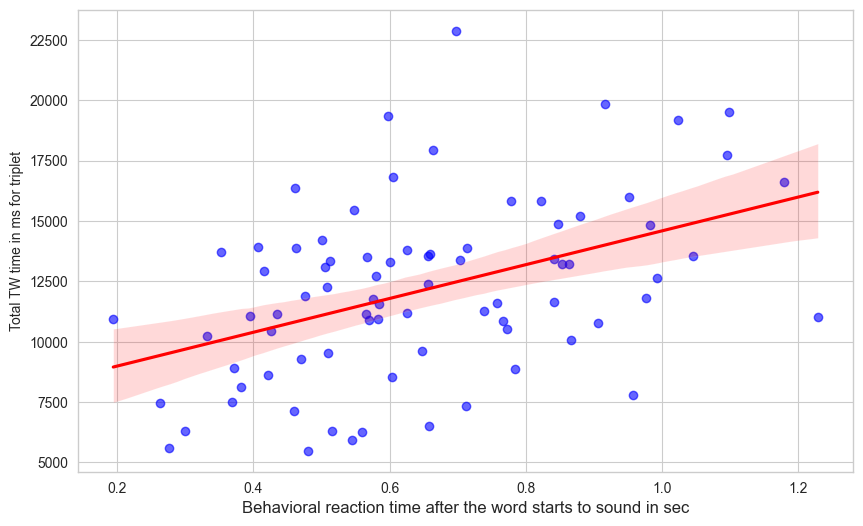

Номер триплета: 41
Испытуемый: 25
Серия: 1
Коэффициент корреляции Пирсона: 0.30
p-значение: 0.0062


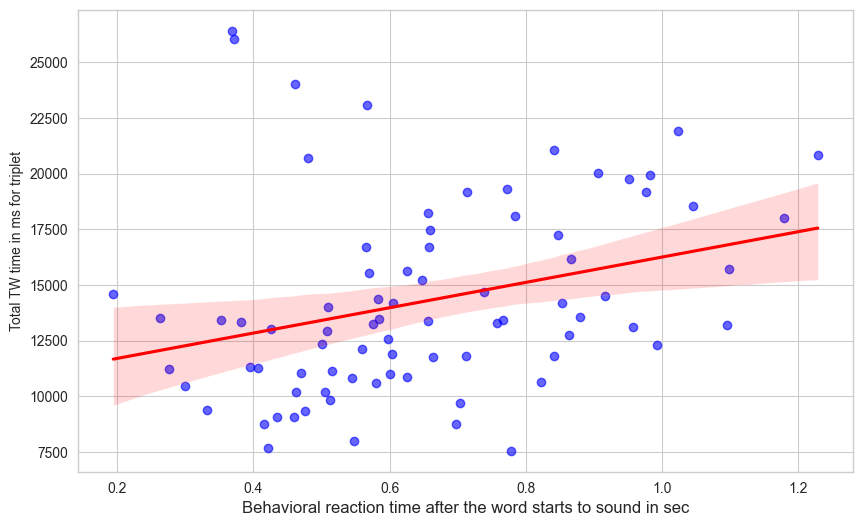

Номер триплета: 42
Испытуемый: 25
Серия: 1
Коэффициент корреляции Пирсона: 0.33
p-значение: 0.0032


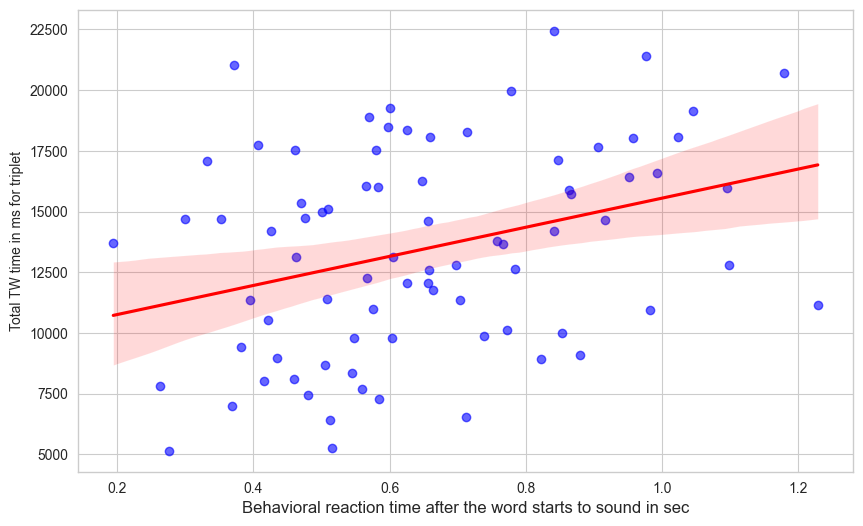

Номер триплета: 74
Испытуемый: 25
Серия: 1
Коэффициент корреляции Пирсона: -0.34
p-значение: 0.0020


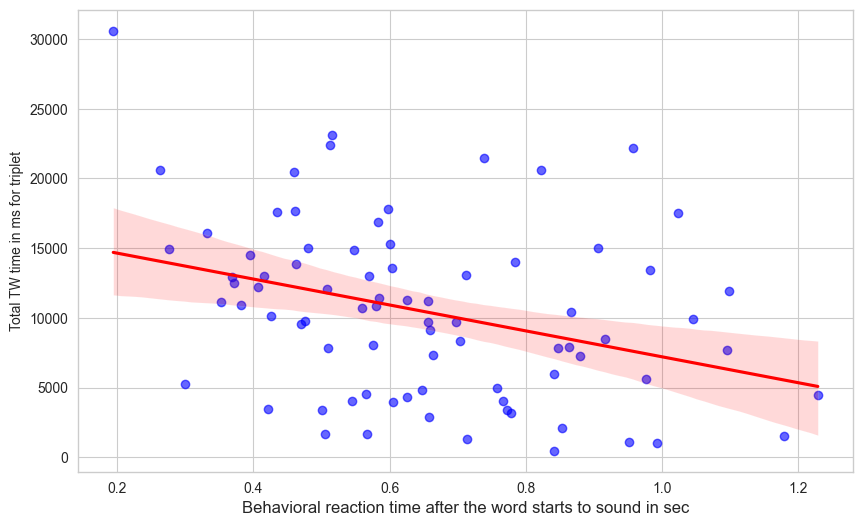

Номер триплета: 75
Испытуемый: 25
Серия: 1
Коэффициент корреляции Пирсона: 0.31
p-значение: 0.0052


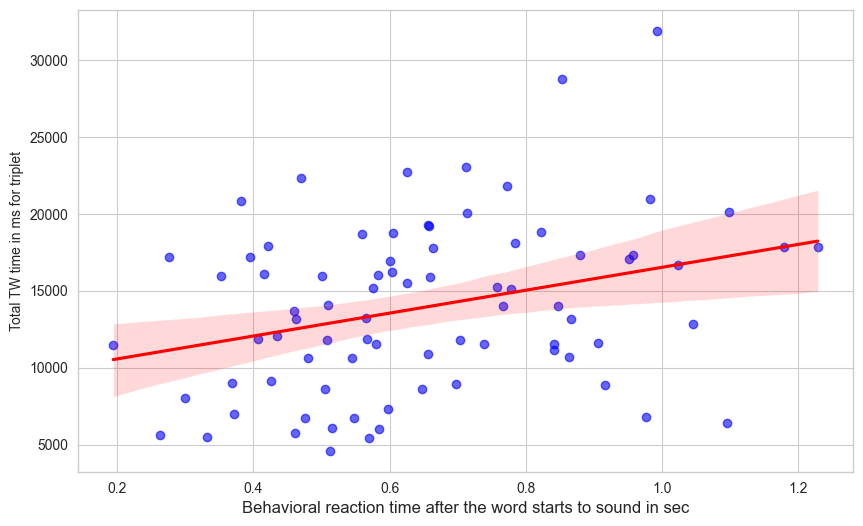

Номер триплета: 90
Испытуемый: 25
Серия: 2
Коэффициент корреляции Пирсона: 0.34
p-значение: 0.0034


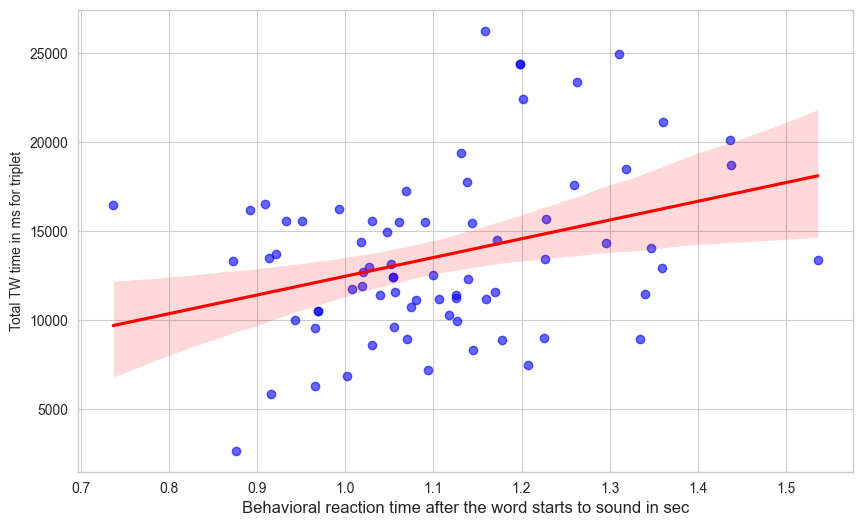

Номер триплета: 5
Испытуемый: 25
Серия: 3
Коэффициент корреляции Пирсона: -0.32
p-значение: 0.0052


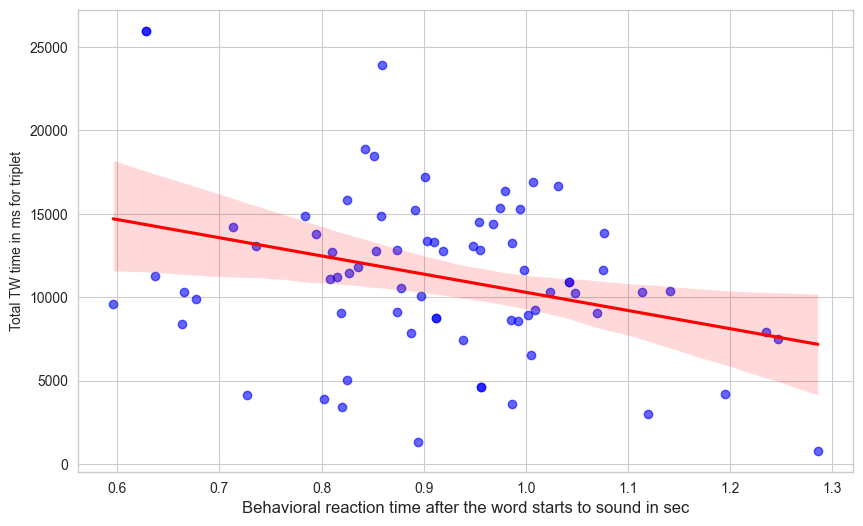

Номер триплета: 10
Испытуемый: 25
Серия: 3
Коэффициент корреляции Пирсона: 0.47
p-значение: 0.0000


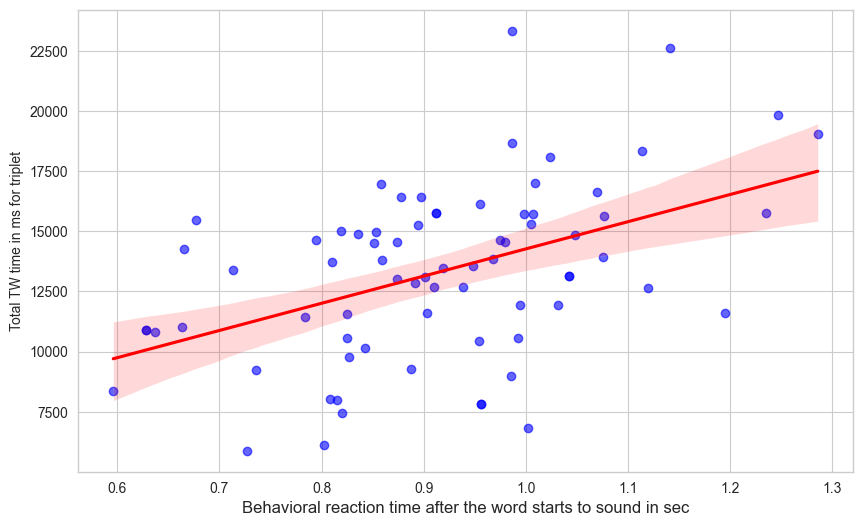

Номер триплета: 40
Испытуемый: 25
Серия: 3
Коэффициент корреляции Пирсона: 0.30
p-значение: 0.0087


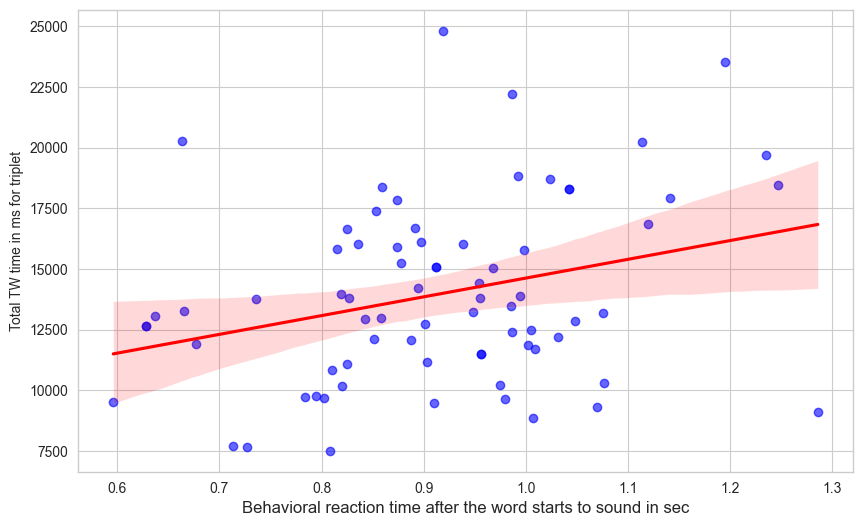

Номер триплета: 93
Испытуемый: 25
Серия: 3
Коэффициент корреляции Пирсона: 0.34
p-значение: 0.0034


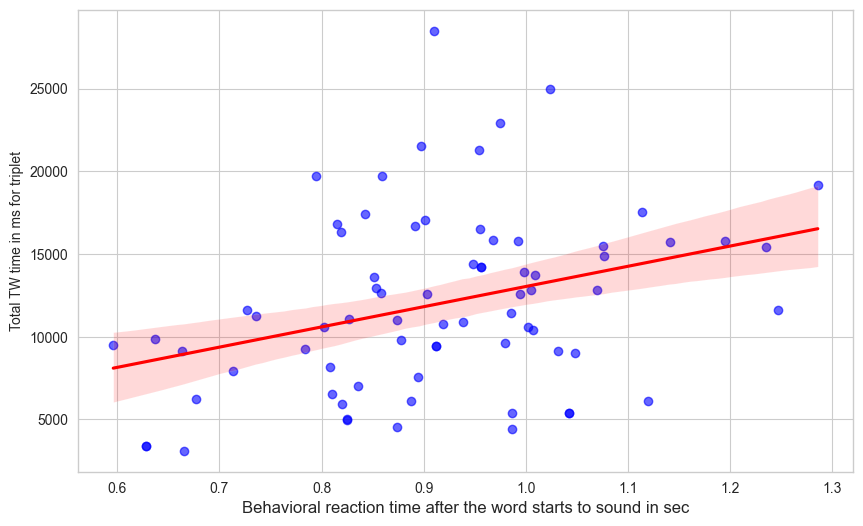

Номер триплета: 66
Испытуемый: 26
Серия: 2
Коэффициент корреляции Пирсона: 0.32
p-значение: 0.0051


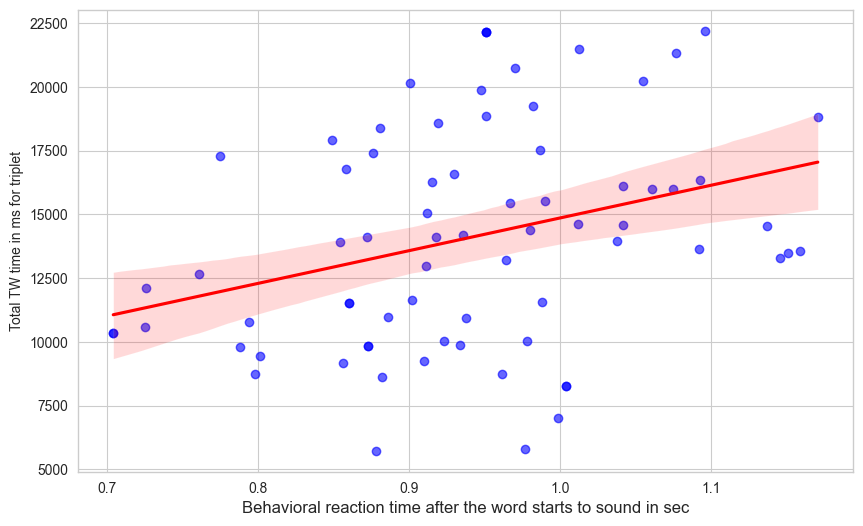

Номер триплета: 6
Испытуемый: 26
Серия: 3
Коэффициент корреляции Пирсона: -0.33
p-значение: 0.0044


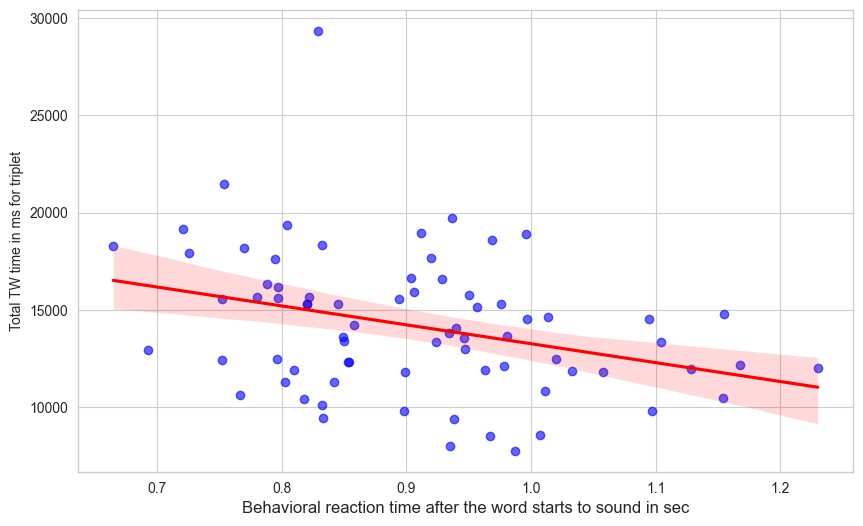

Номер триплета: 69
Испытуемый: 26
Серия: 3
Коэффициент корреляции Пирсона: 0.30
p-значение: 0.0095


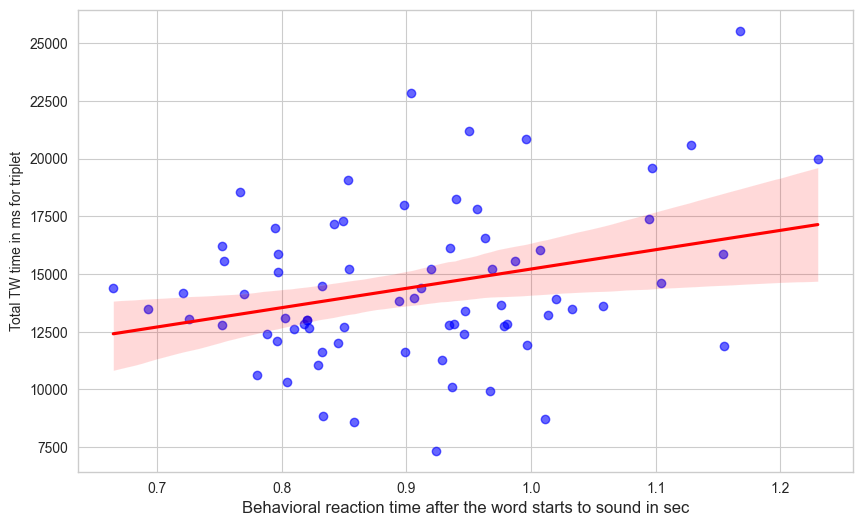

Номер триплета: 28
Испытуемый: 27
Серия: 1
Коэффициент корреляции Пирсона: 0.35
p-значение: 0.0028


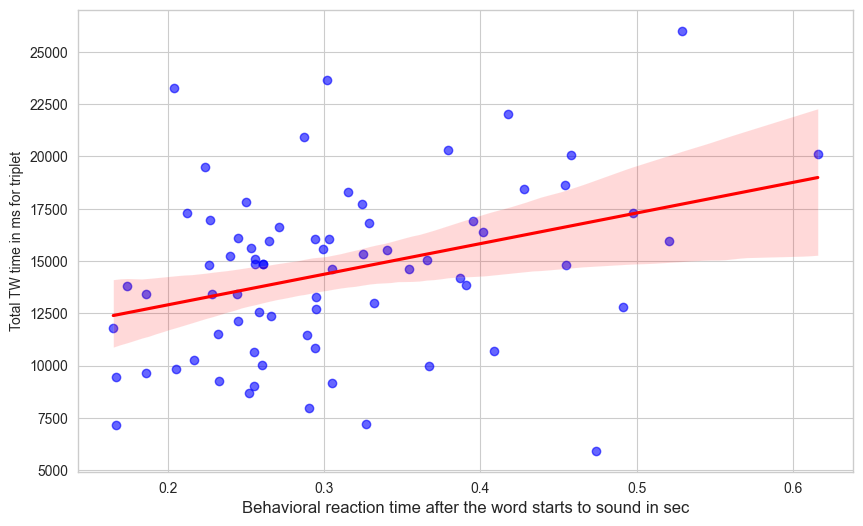

Номер триплета: 57
Испытуемый: 27
Серия: 1
Коэффициент корреляции Пирсона: -0.32
p-значение: 0.0062


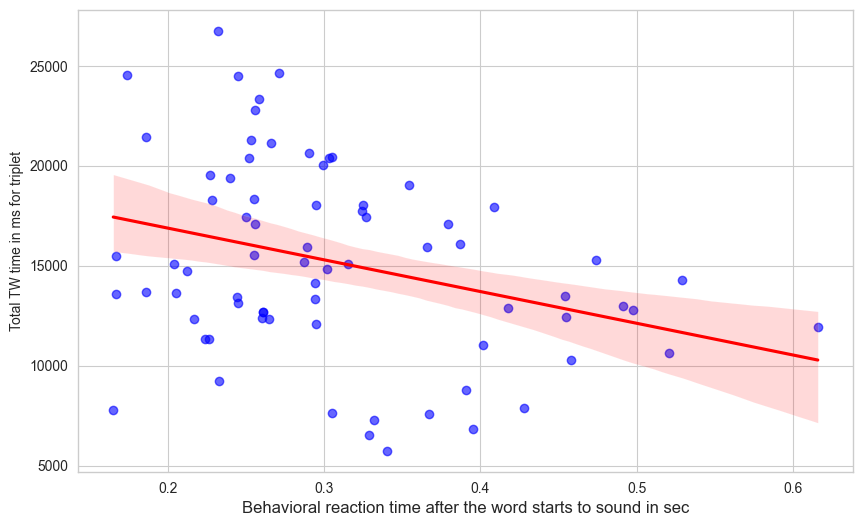

Номер триплета: 96
Испытуемый: 27
Серия: 1
Коэффициент корреляции Пирсона: 0.31
p-значение: 0.0087


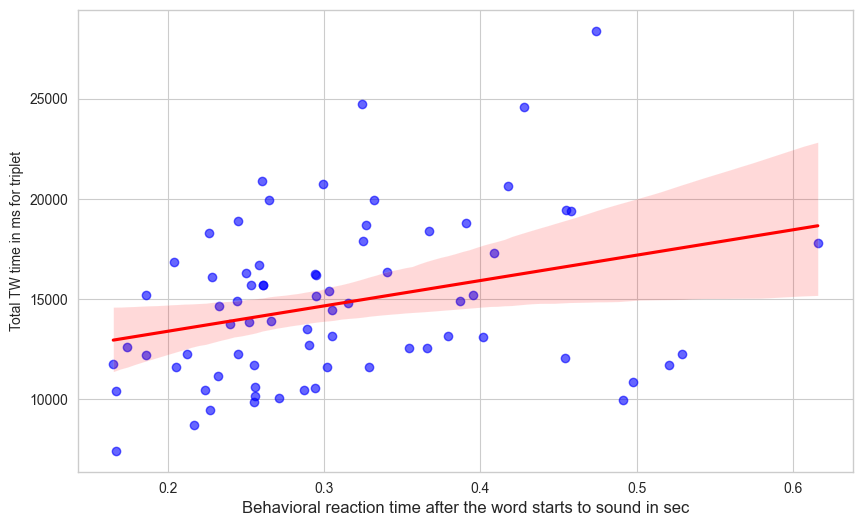

Номер триплета: 85
Испытуемый: 27
Серия: 2
Коэффициент корреляции Пирсона: 0.31
p-значение: 0.0046


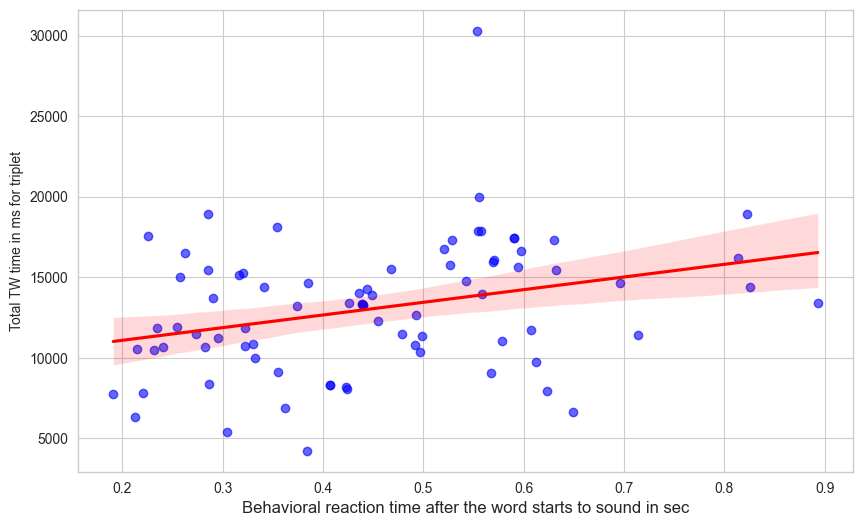

Номер триплета: 7
Испытуемый: 27
Серия: 3
Коэффициент корреляции Пирсона: -0.29
p-значение: 0.0097


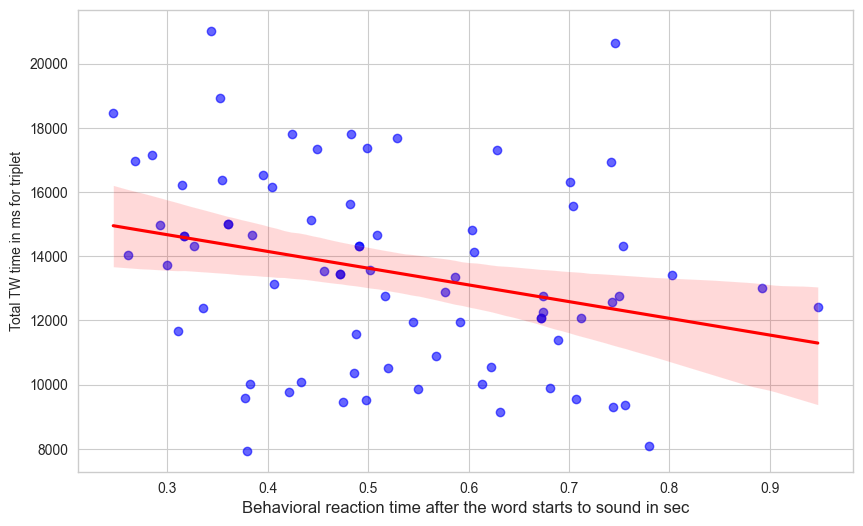

Номер триплета: 40
Испытуемый: 27
Серия: 3
Коэффициент корреляции Пирсона: 0.30
p-значение: 0.0074


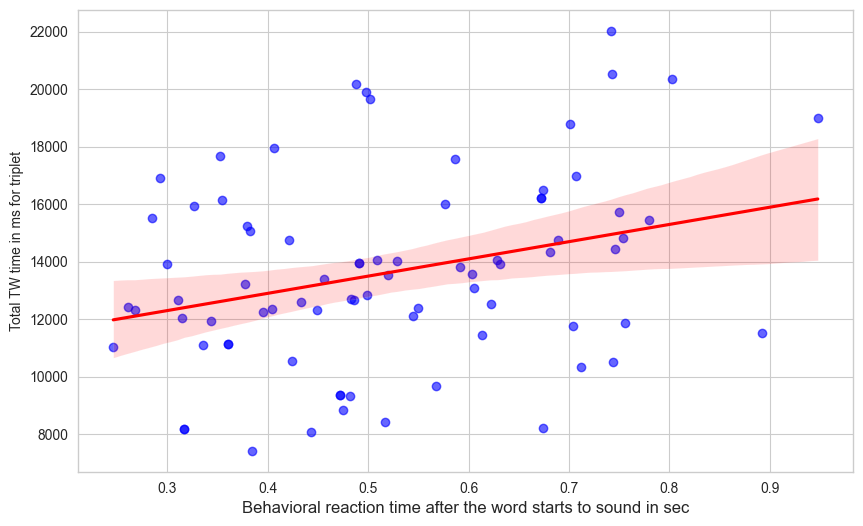

Номер триплета: 72
Испытуемый: 28
Серия: 1
Коэффициент корреляции Пирсона: 0.31
p-значение: 0.0064


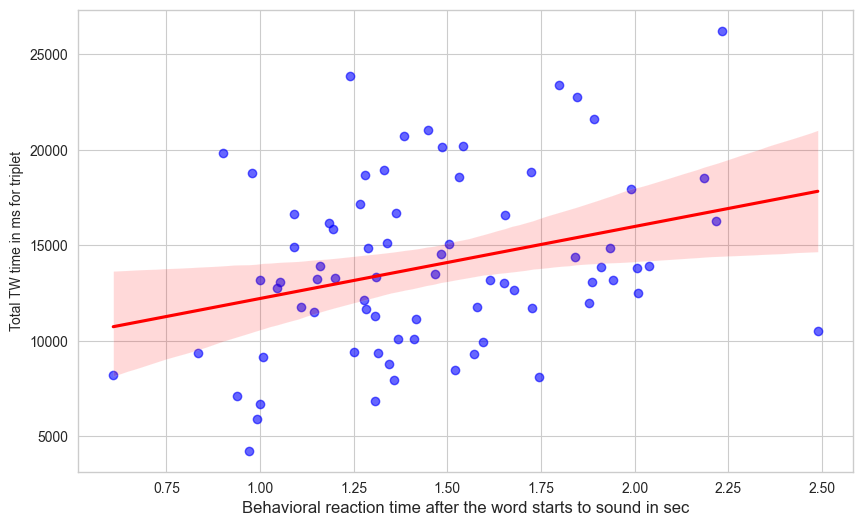

Номер триплета: 83
Испытуемый: 28
Серия: 2
Коэффициент корреляции Пирсона: -0.33
p-значение: 0.0030


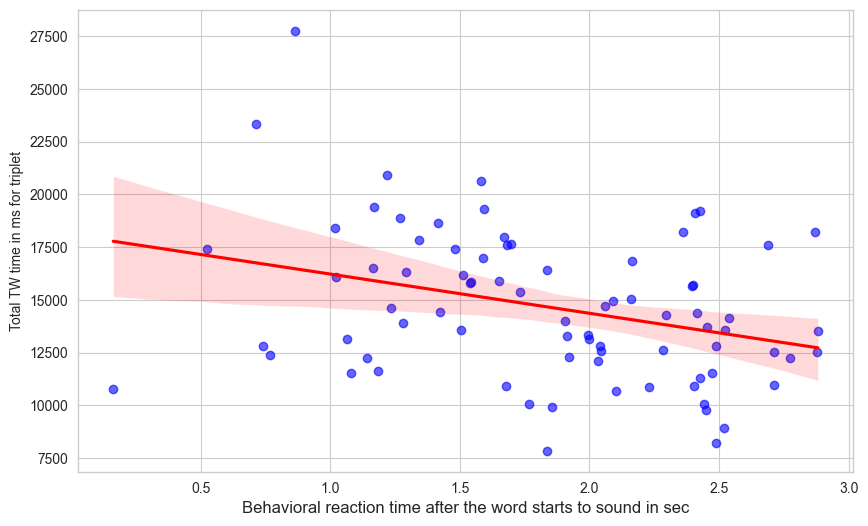

Номер триплета: 74
Испытуемый: 28
Серия: 3
Коэффициент корреляции Пирсона: -0.31
p-значение: 0.0061


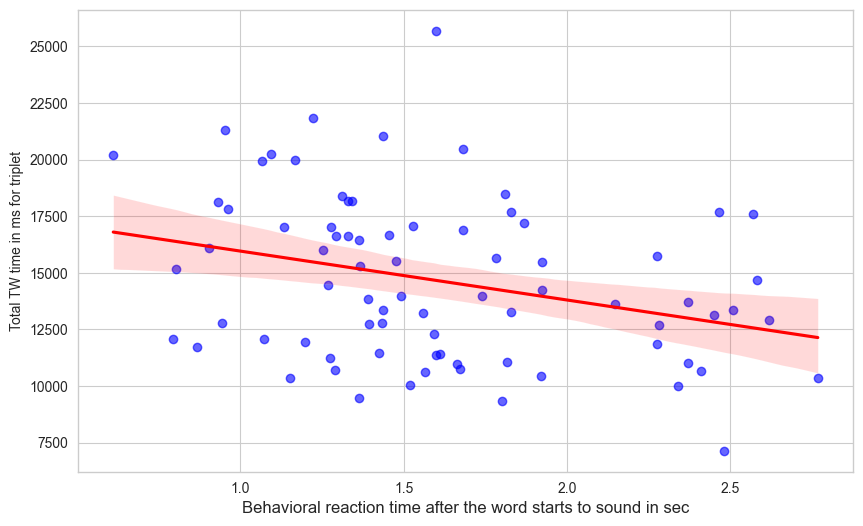

Номер триплета: 18
Испытуемый: 33
Серия: 1
Коэффициент корреляции Пирсона: -0.40
p-значение: 0.0003


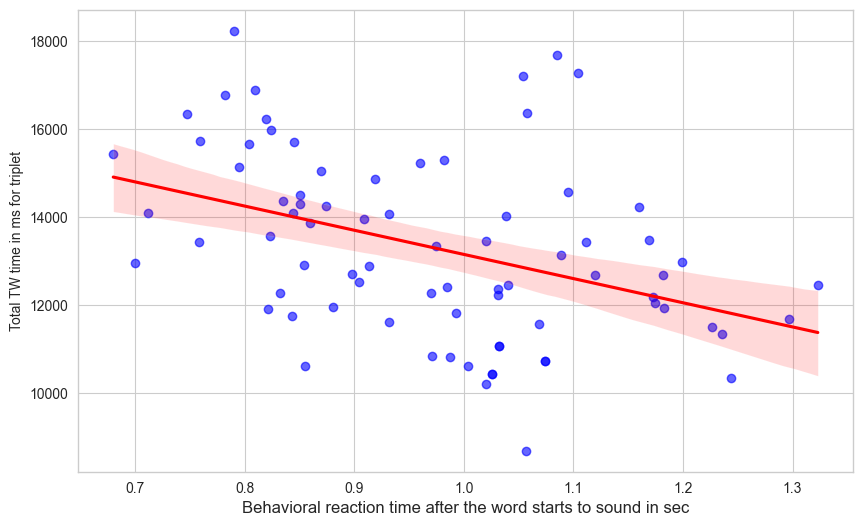

Номер триплета: 59
Испытуемый: 33
Серия: 1
Коэффициент корреляции Пирсона: 0.36
p-значение: 0.0012


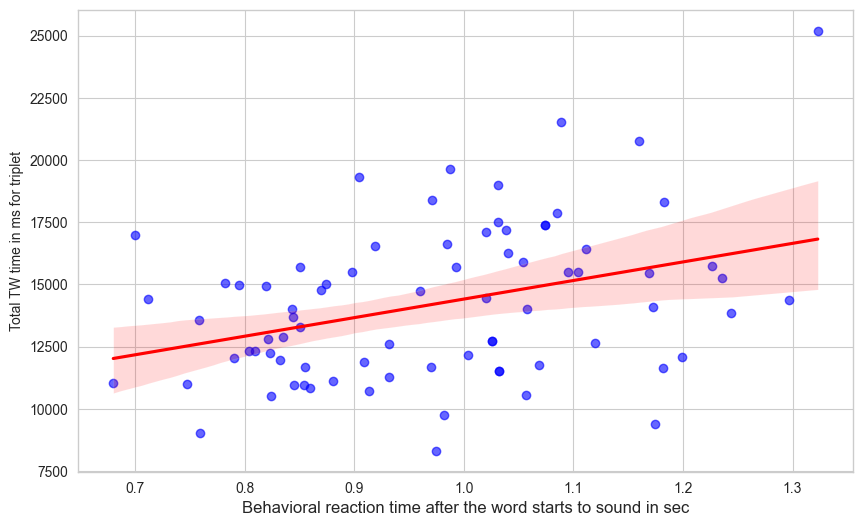

Номер триплета: 65
Испытуемый: 33
Серия: 3
Коэффициент корреляции Пирсона: -0.30
p-значение: 0.0094


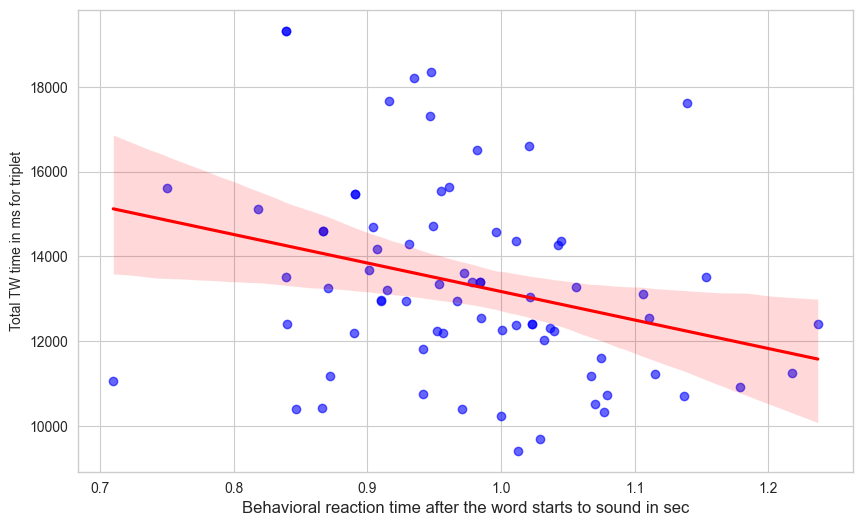

Номер триплета: 16
Испытуемый: 34
Серия: 1
Коэффициент корреляции Пирсона: -0.37
p-значение: 0.0007


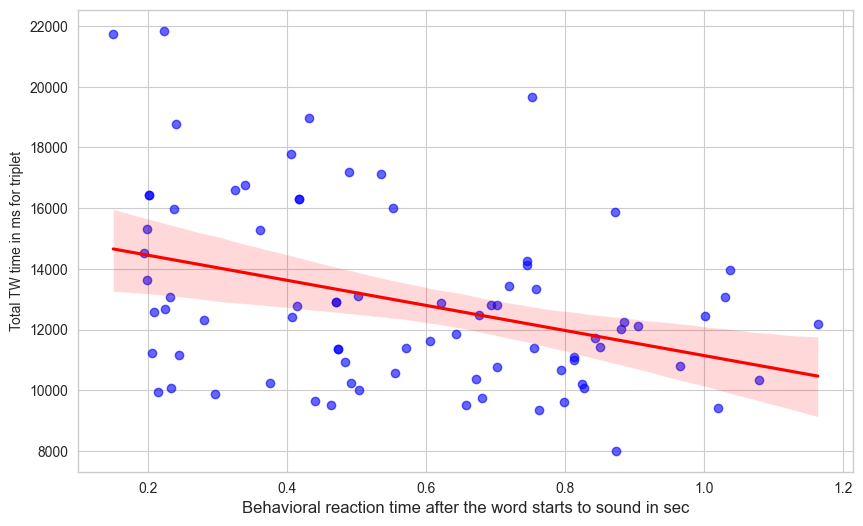

Номер триплета: 31
Испытуемый: 34
Серия: 1
Коэффициент корреляции Пирсона: -0.36
p-значение: 0.0009


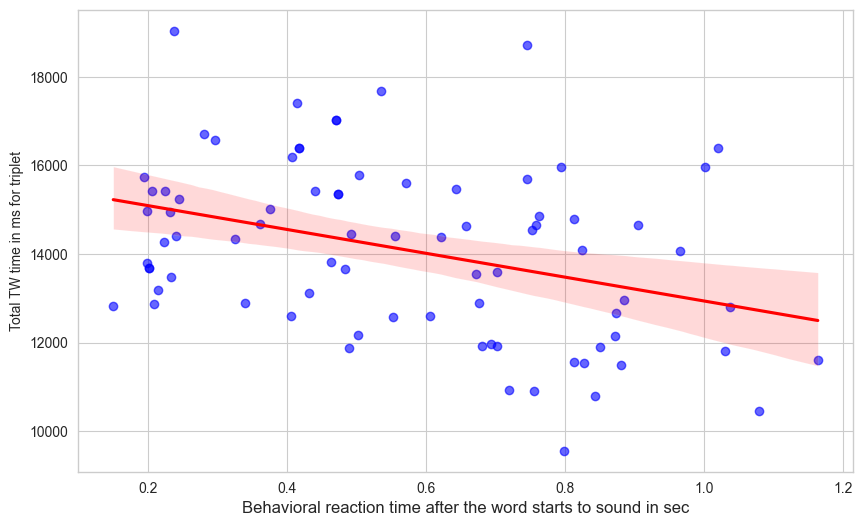

Номер триплета: 72
Испытуемый: 34
Серия: 1
Коэффициент корреляции Пирсона: 0.29
p-значение: 0.0100


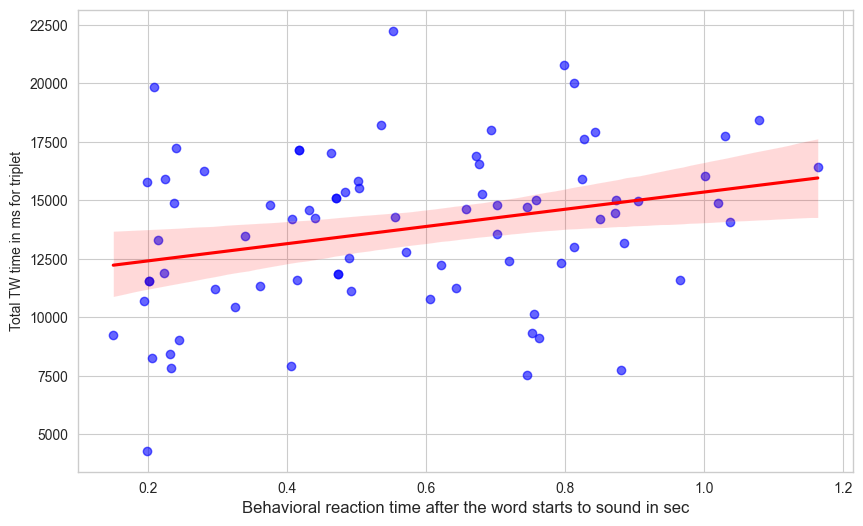

Номер триплета: 90
Испытуемый: 34
Серия: 1
Коэффициент корреляции Пирсона: 0.33
p-значение: 0.0028


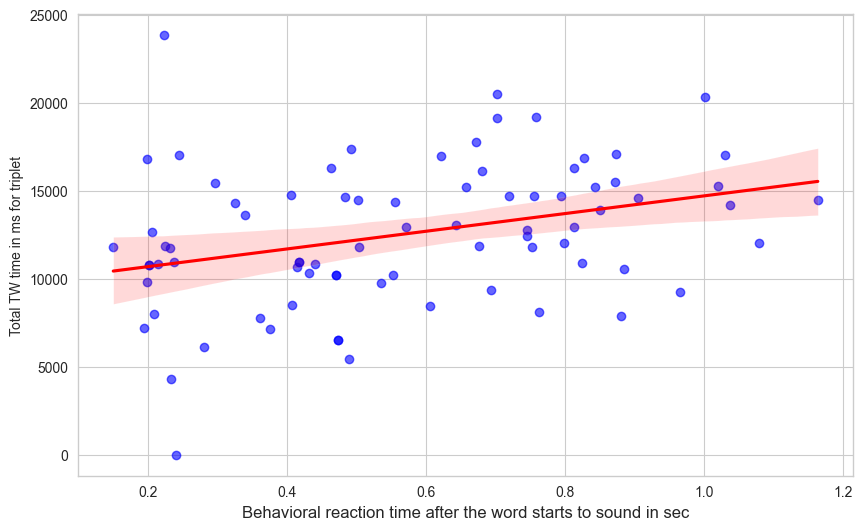

Номер триплета: 37
Испытуемый: 34
Серия: 2
Коэффициент корреляции Пирсона: 0.33
p-значение: 0.0029


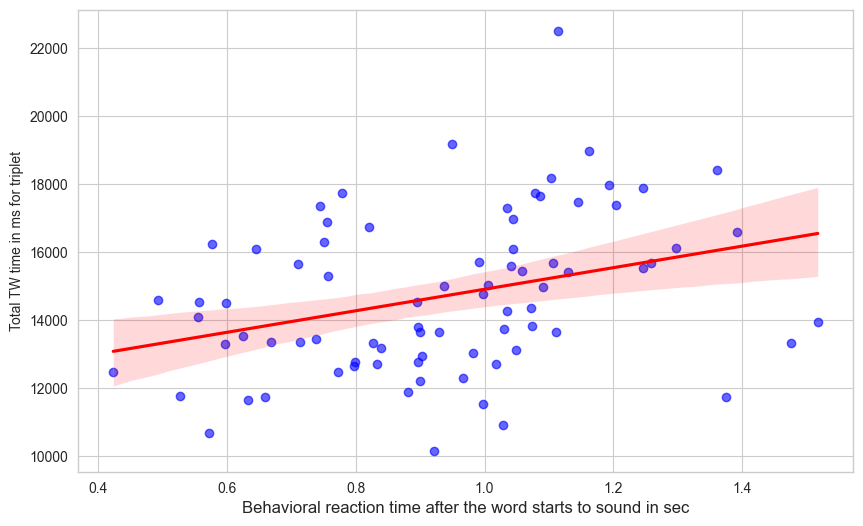

Номер триплета: 19
Испытуемый: 34
Серия: 3
Коэффициент корреляции Пирсона: 0.33
p-значение: 0.0051


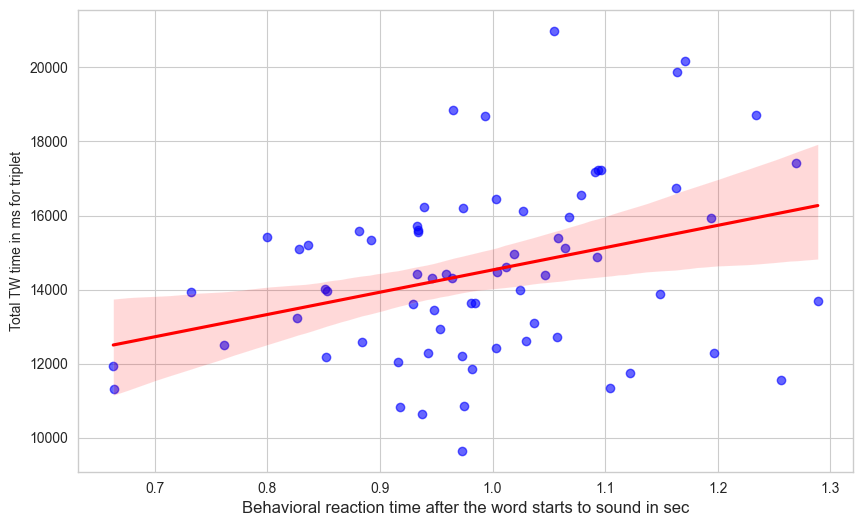

Номер триплета: 86
Испытуемый: 35
Серия: 1
Коэффициент корреляции Пирсона: -0.30
p-значение: 0.0084


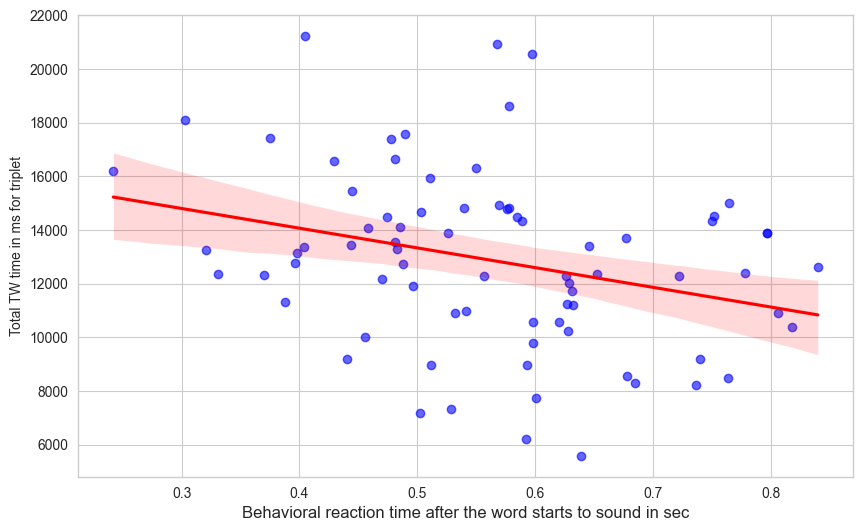

Номер триплета: 25
Испытуемый: 35
Серия: 2
Коэффициент корреляции Пирсона: -0.31
p-значение: 0.0047


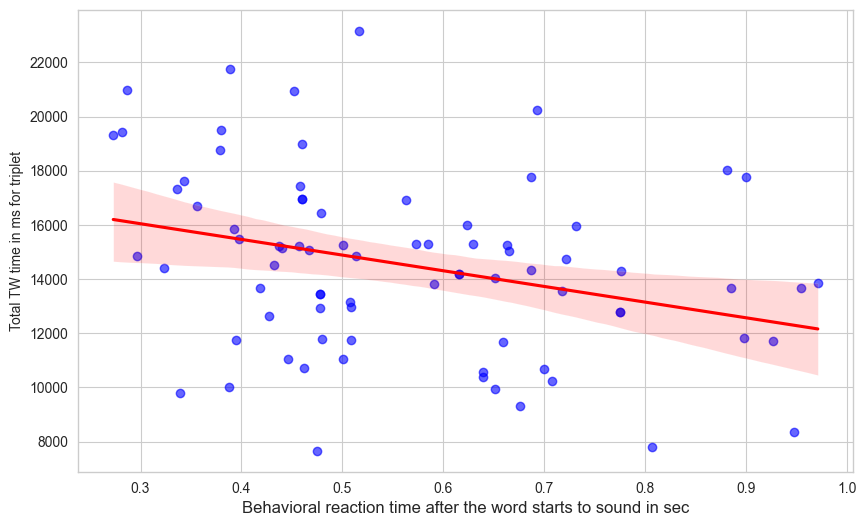

Номер триплета: 16
Испытуемый: 35
Серия: 3
Коэффициент корреляции Пирсона: 0.30
p-значение: 0.0067


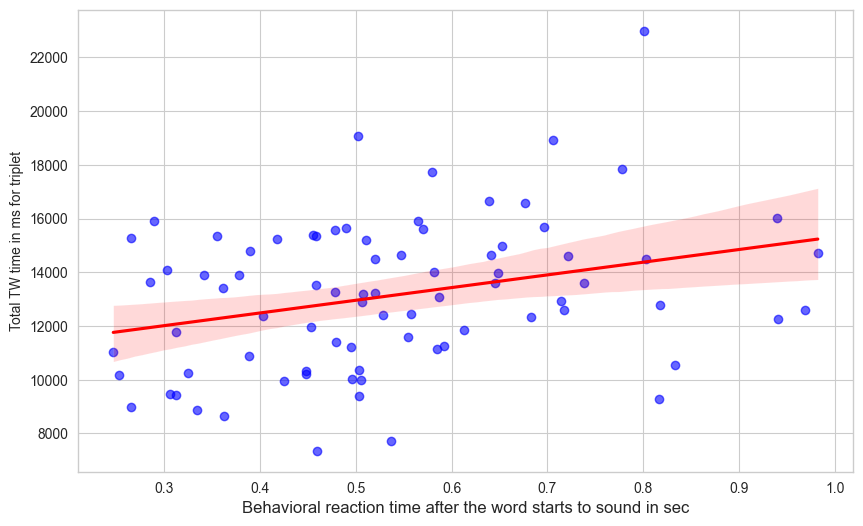

Номер триплета: 48
Испытуемый: 35
Серия: 3
Коэффициент корреляции Пирсона: -0.29
p-значение: 0.0080


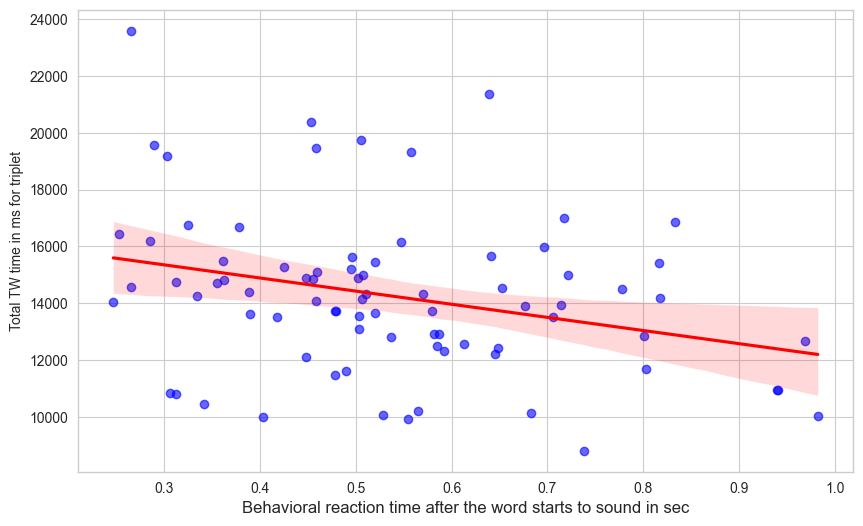

Номер триплета: 78
Испытуемый: 35
Серия: 3
Коэффициент корреляции Пирсона: 0.42
p-значение: 0.0001


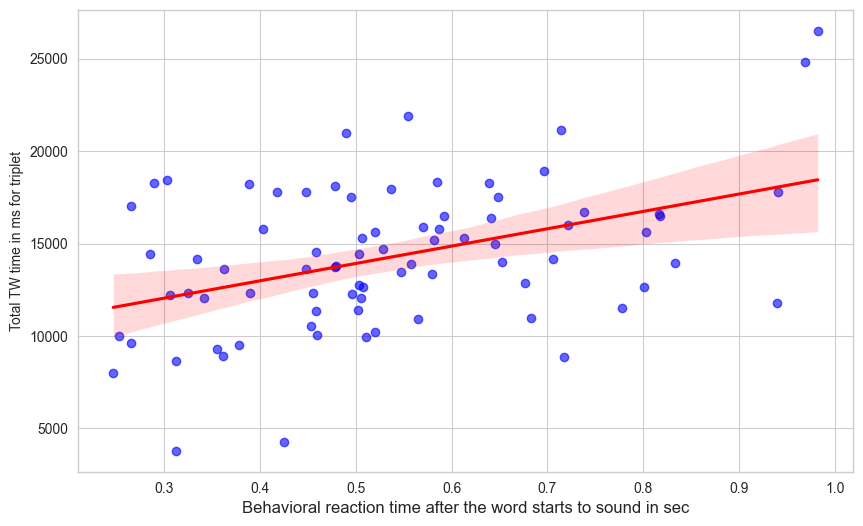

Номер триплета: 68
Испытуемый: 38
Серия: 1
Коэффициент корреляции Пирсона: 0.32
p-значение: 0.0050


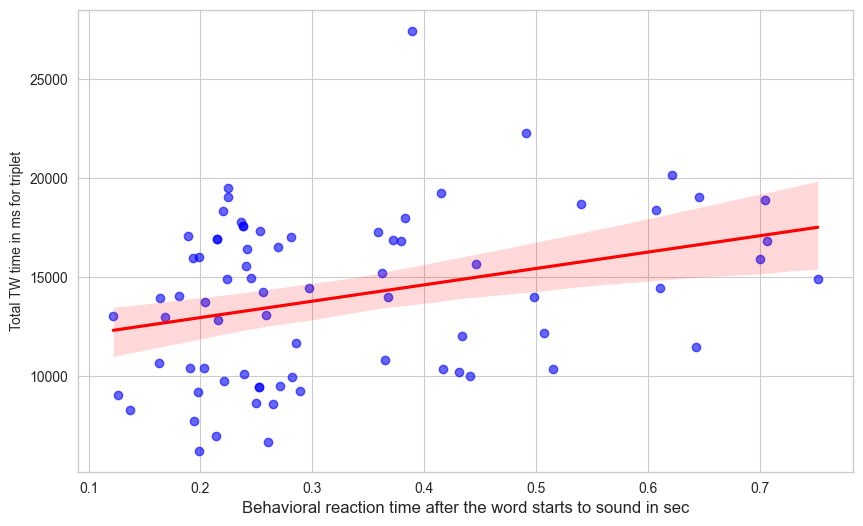

Номер триплета: 98
Испытуемый: 38
Серия: 1
Коэффициент корреляции Пирсона: 0.32
p-значение: 0.0054


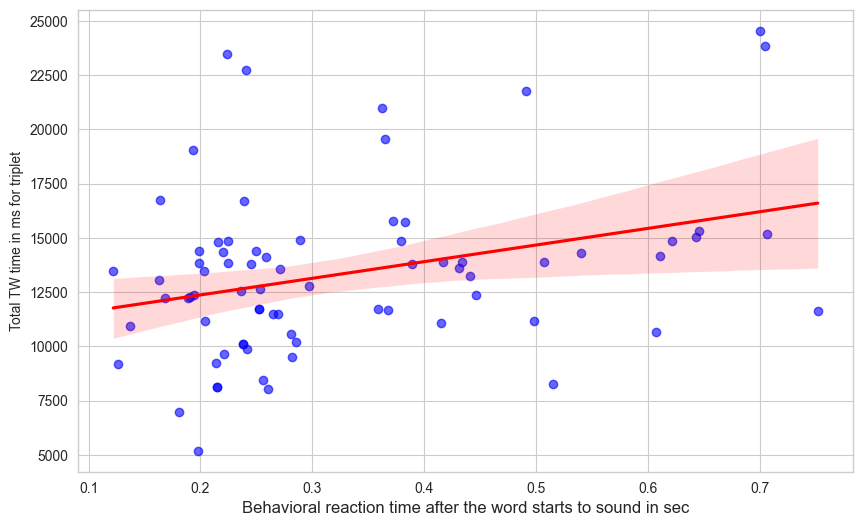

Номер триплета: 65
Испытуемый: 39
Серия: 2
Коэффициент корреляции Пирсона: 0.30
p-значение: 0.0099


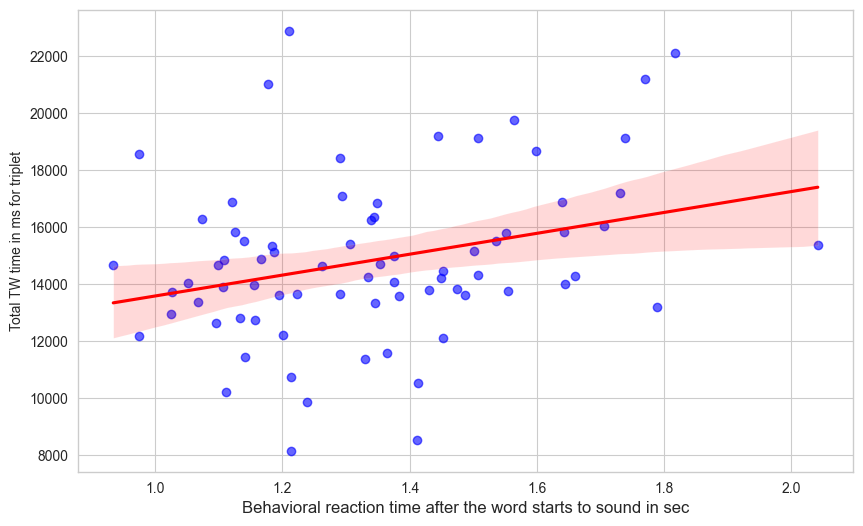

Номер триплета: 67
Испытуемый: 39
Серия: 2
Коэффициент корреляции Пирсона: 0.33
p-значение: 0.0034


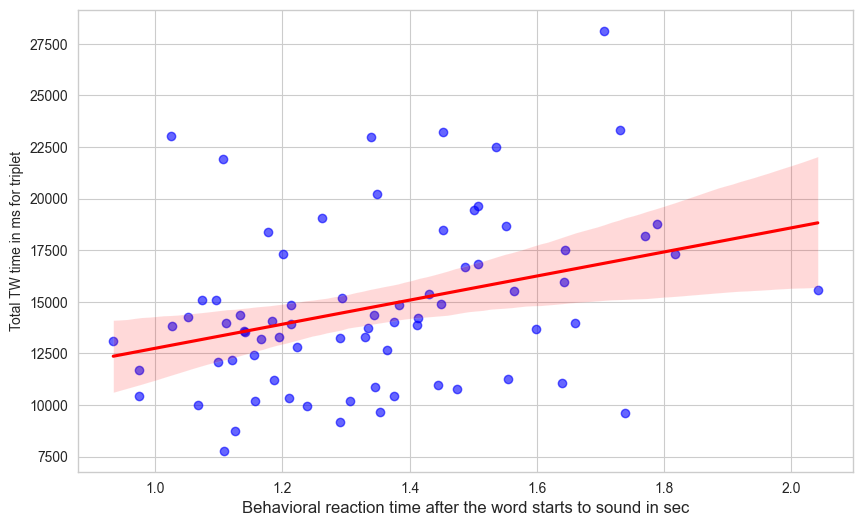

Номер триплета: 13
Испытуемый: 40
Серия: 1
Коэффициент корреляции Пирсона: 0.34
p-значение: 0.0021


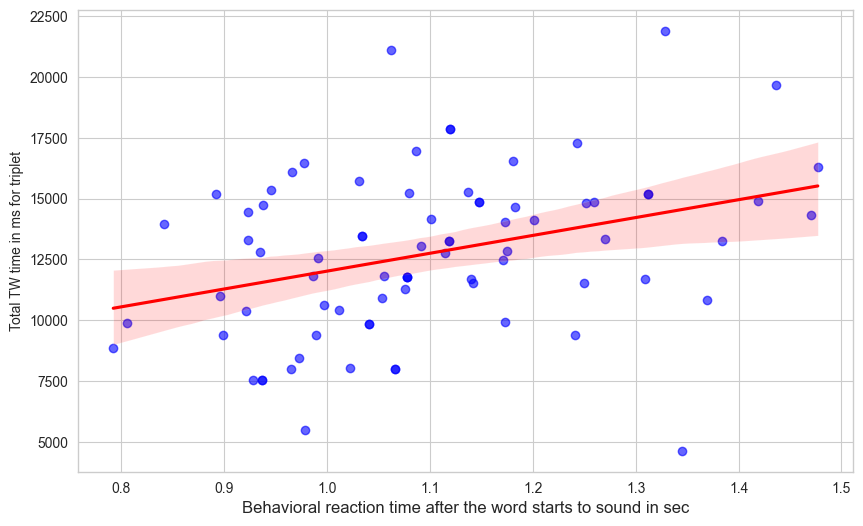

Номер триплета: 76
Испытуемый: 40
Серия: 1
Коэффициент корреляции Пирсона: -0.30
p-значение: 0.0071


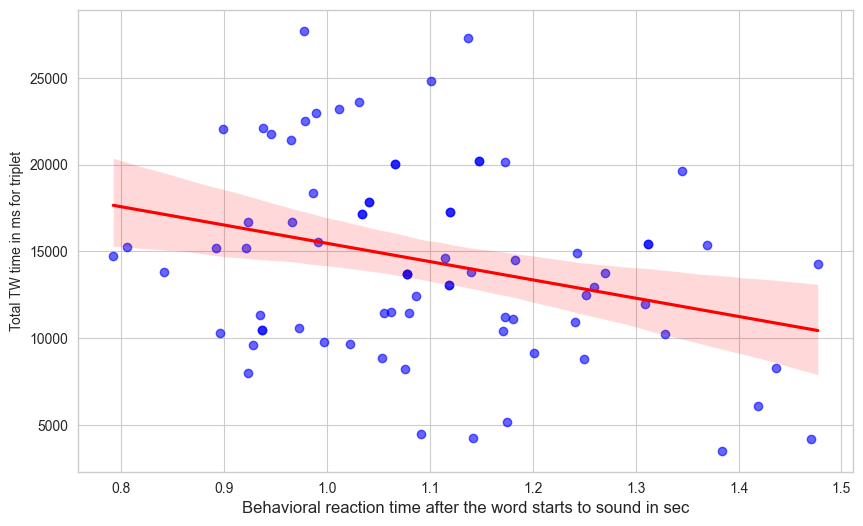

Номер триплета: 85
Испытуемый: 40
Серия: 1
Коэффициент корреляции Пирсона: 0.38
p-значение: 0.0006


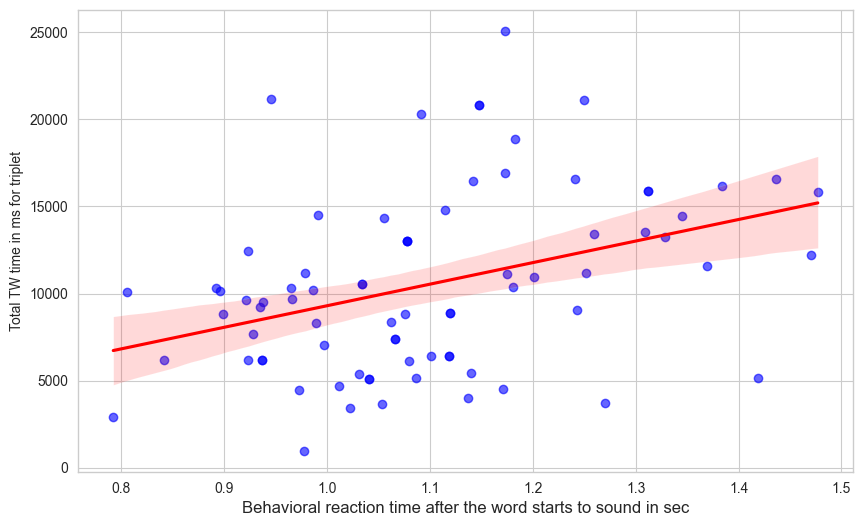

Номер триплета: 60
Испытуемый: 40
Серия: 2
Коэффициент корреляции Пирсона: -0.30
p-значение: 0.0082


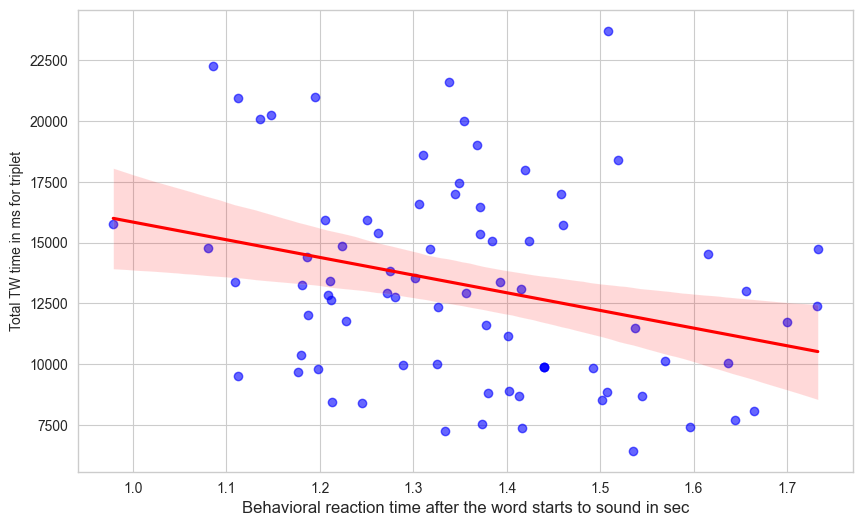

Номер триплета: 78
Испытуемый: 41
Серия: 1
Коэффициент корреляции Пирсона: -0.45
p-значение: 0.0001


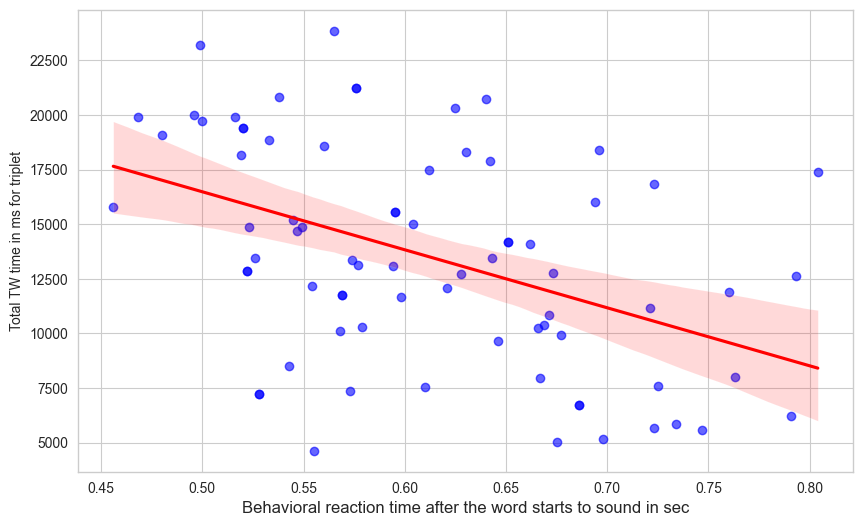

Номер триплета: 32
Испытуемый: 41
Серия: 2
Коэффициент корреляции Пирсона: -0.31
p-значение: 0.0061


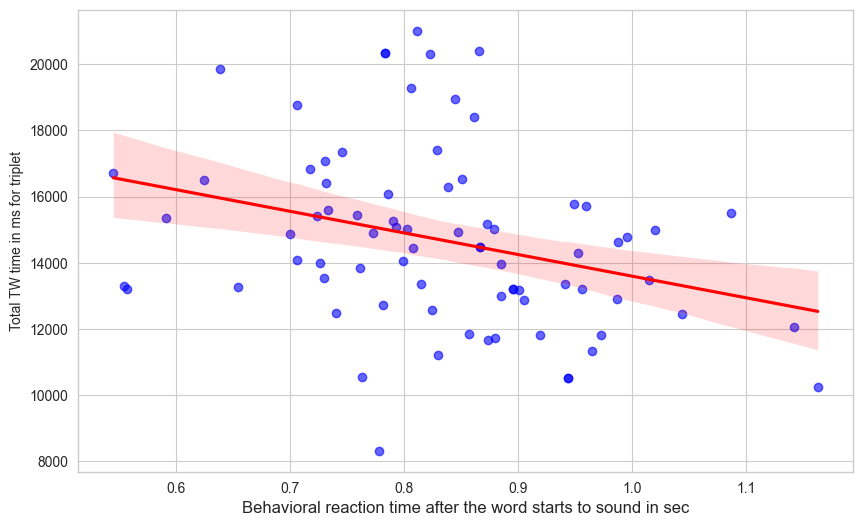

Номер триплета: 36
Испытуемый: 42
Серия: 1
Коэффициент корреляции Пирсона: 0.33
p-значение: 0.0026


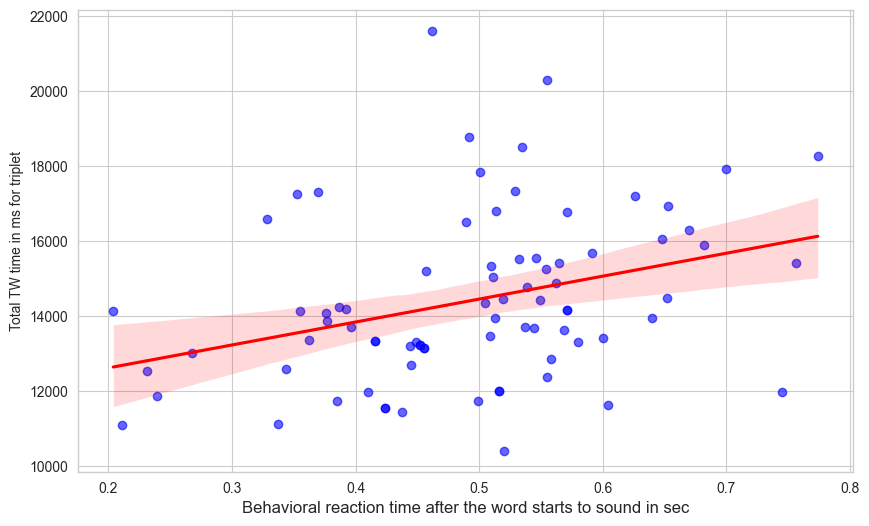

Номер триплета: 98
Испытуемый: 42
Серия: 1
Коэффициент корреляции Пирсона: -0.31
p-значение: 0.0045


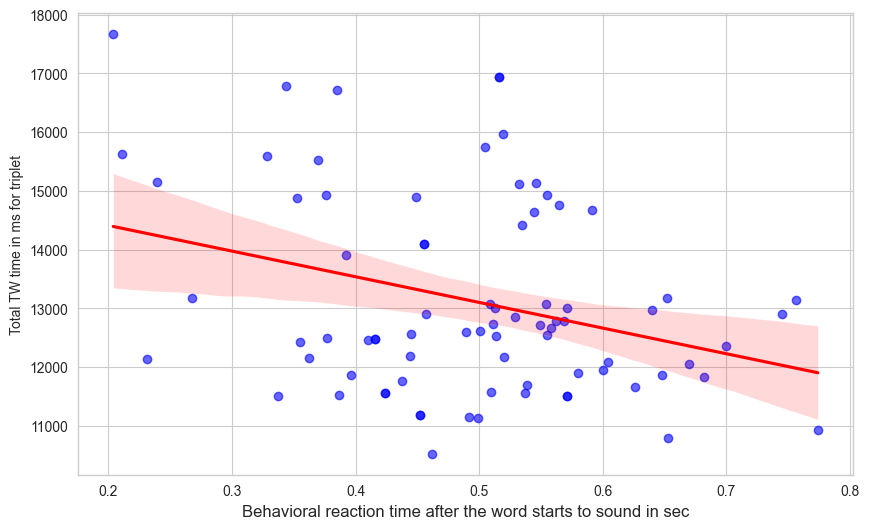

Номер триплета: 29
Испытуемый: 42
Серия: 2
Коэффициент корреляции Пирсона: 0.32
p-значение: 0.0035


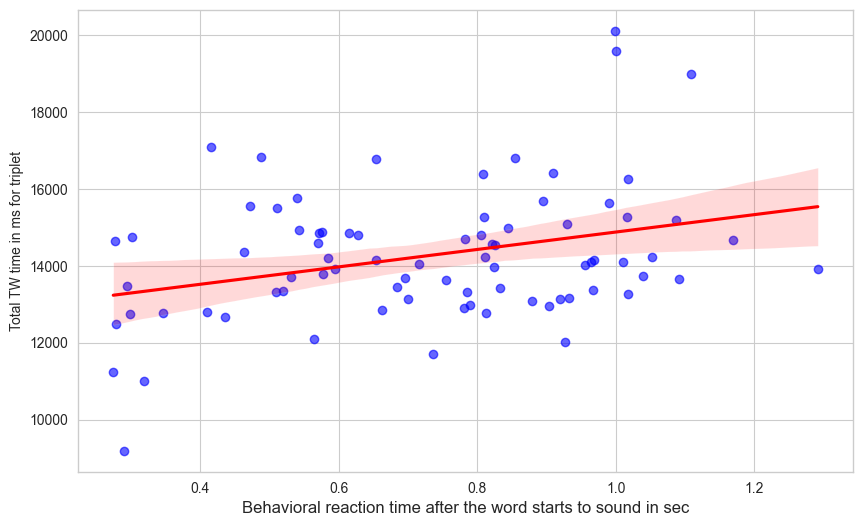

Номер триплета: 58
Испытуемый: 42
Серия: 3
Коэффициент корреляции Пирсона: 0.38
p-значение: 0.0004


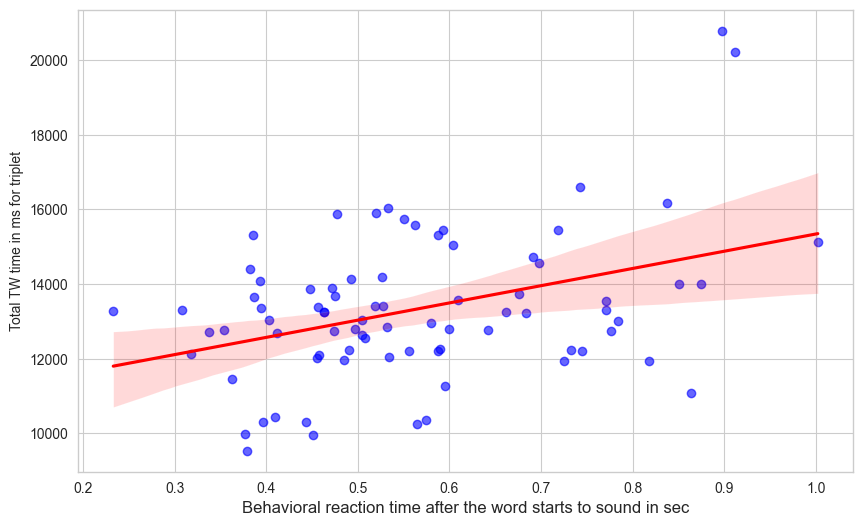

Номер триплета: 64
Испытуемый: 42
Серия: 3
Коэффициент корреляции Пирсона: 0.36
p-значение: 0.0011


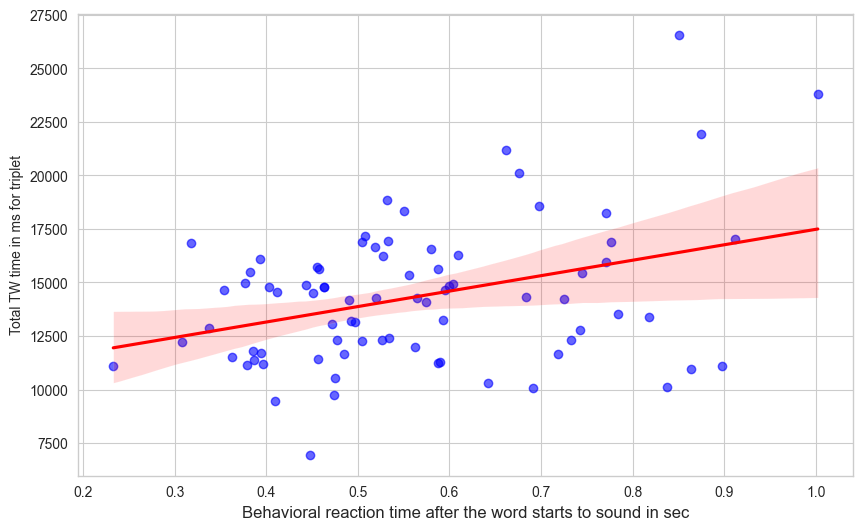

Номер триплета: 101
Испытуемый: 42
Серия: 3
Коэффициент корреляции Пирсона: 0.30
p-значение: 0.0078


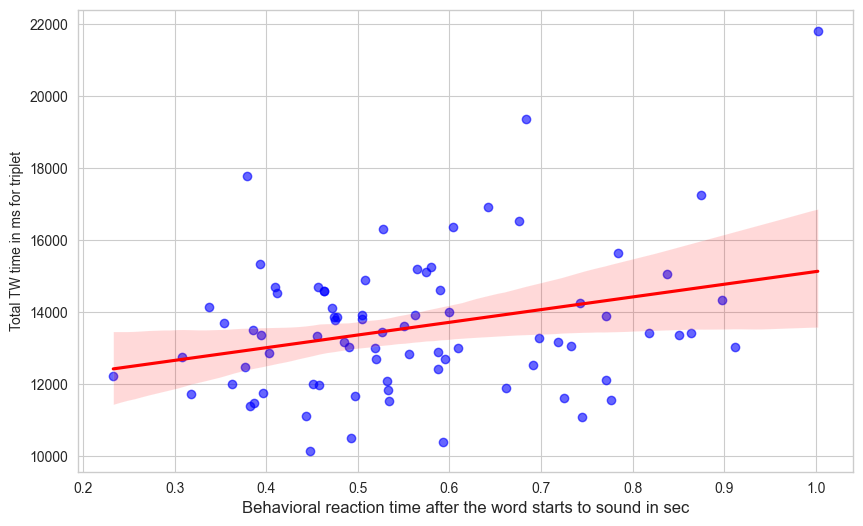

Номер триплета: 79
Испытуемый: 43
Серия: 1
Коэффициент корреляции Пирсона: 0.37
p-значение: 0.0007


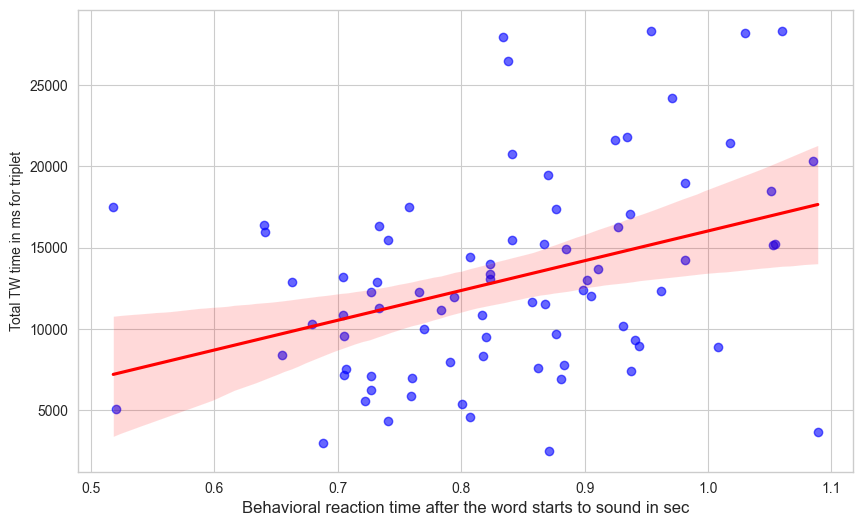

Номер триплета: 43
Испытуемый: 44
Серия: 2
Коэффициент корреляции Пирсона: 0.37
p-значение: 0.0007


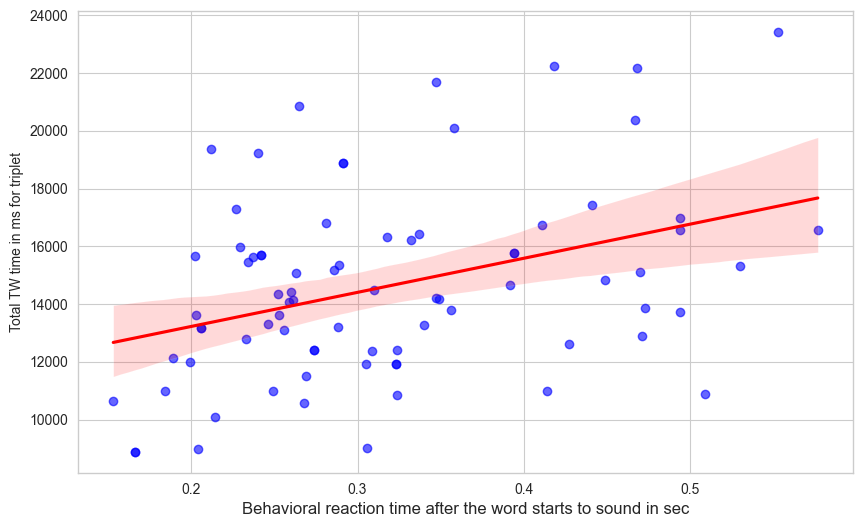

Номер триплета: 99
Испытуемый: 44
Серия: 2
Коэффициент корреляции Пирсона: -0.34
p-значение: 0.0020


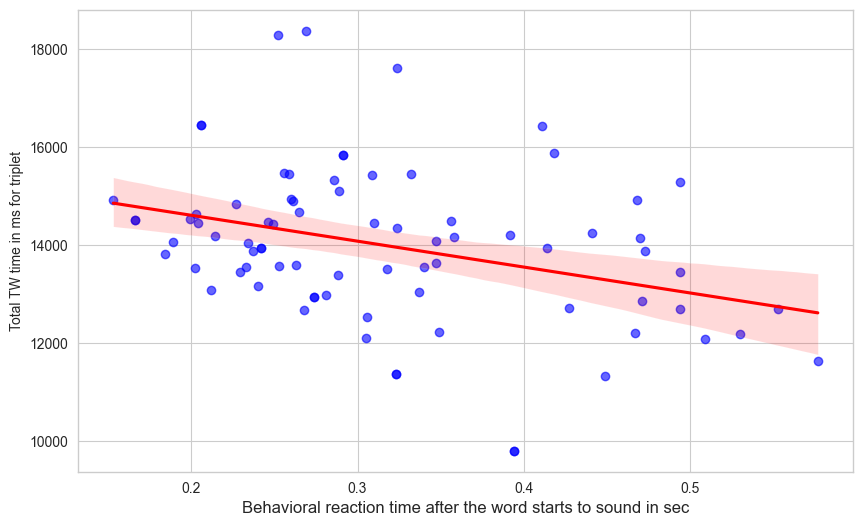

Номер триплета: 83
Испытуемый: 44
Серия: 3
Коэффициент корреляции Пирсона: 0.29
p-значение: 0.0100


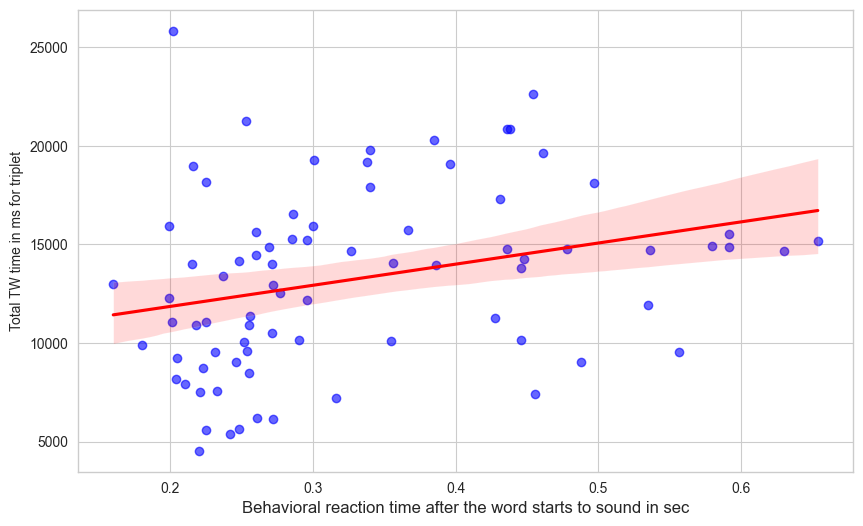

Номер триплета: 94
Испытуемый: 44
Серия: 3
Коэффициент корреляции Пирсона: -0.31
p-значение: 0.0057


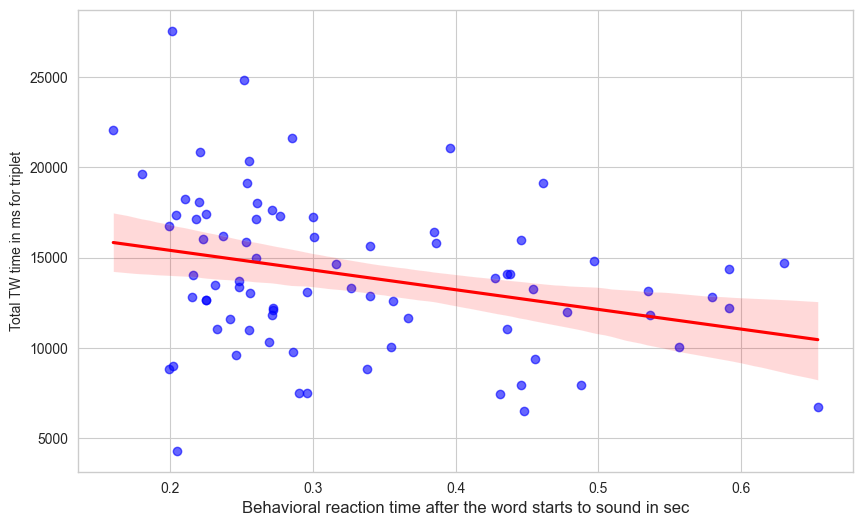

Номер триплета: 27
Испытуемый: 45
Серия: 3
Коэффициент корреляции Пирсона: 0.31
p-значение: 0.0059


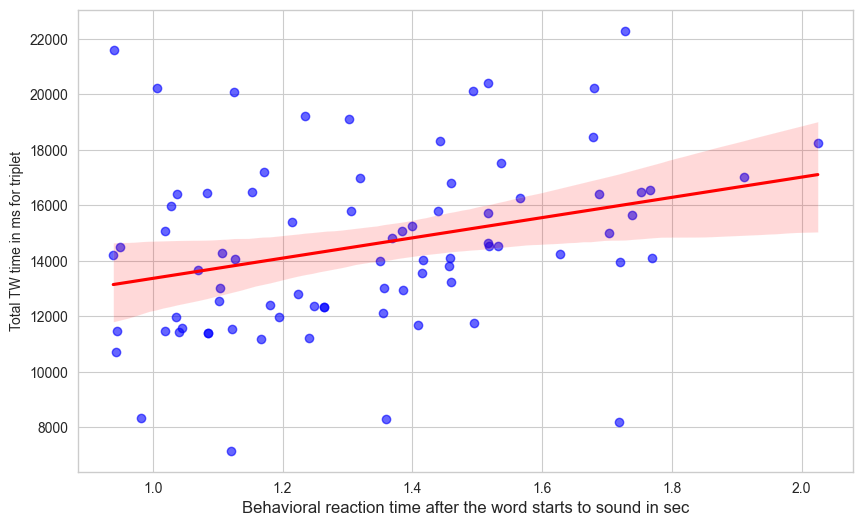

Номер триплета: 31
Испытуемый: 45
Серия: 3
Коэффициент корреляции Пирсона: 0.29
p-значение: 0.0091


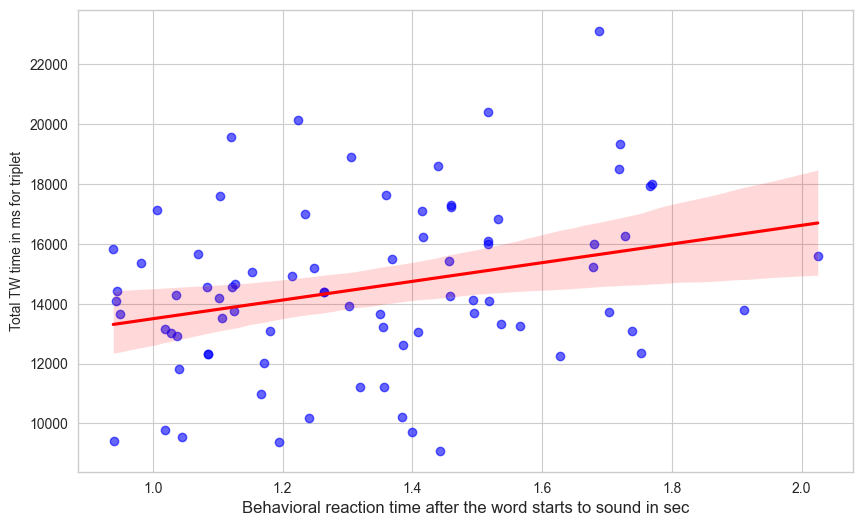

Номер триплета: 100
Испытуемый: 45
Серия: 3
Коэффициент корреляции Пирсона: -0.38
p-значение: 0.0006


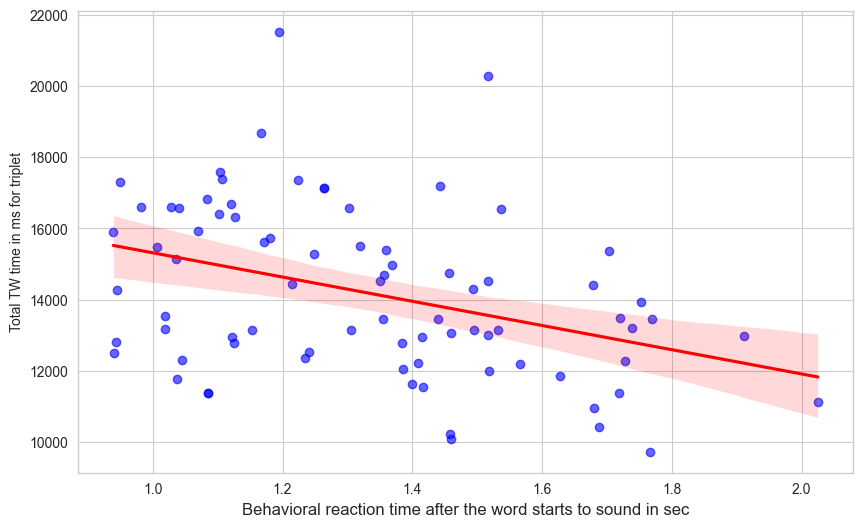

Номер триплета: 45
Испытуемый: 46
Серия: 1
Коэффициент корреляции Пирсона: -0.30
p-значение: 0.0072


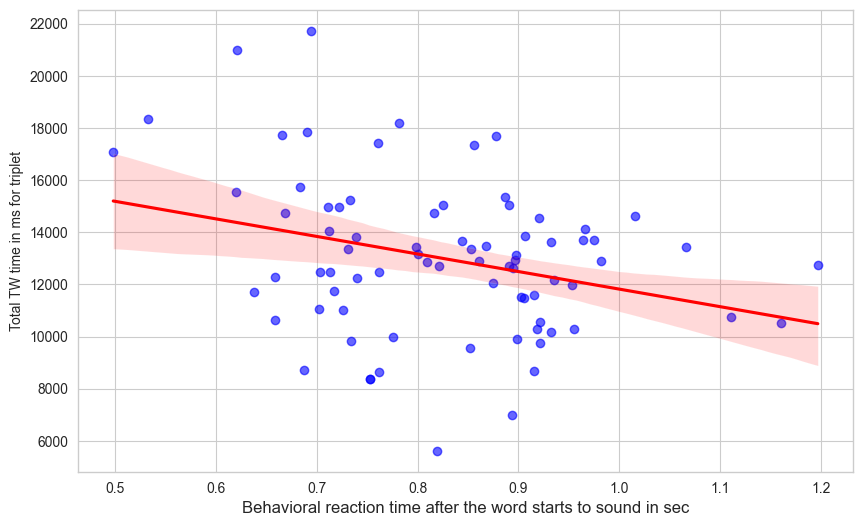

Номер триплета: 88
Испытуемый: 46
Серия: 1
Коэффициент корреляции Пирсона: -0.29
p-значение: 0.0100


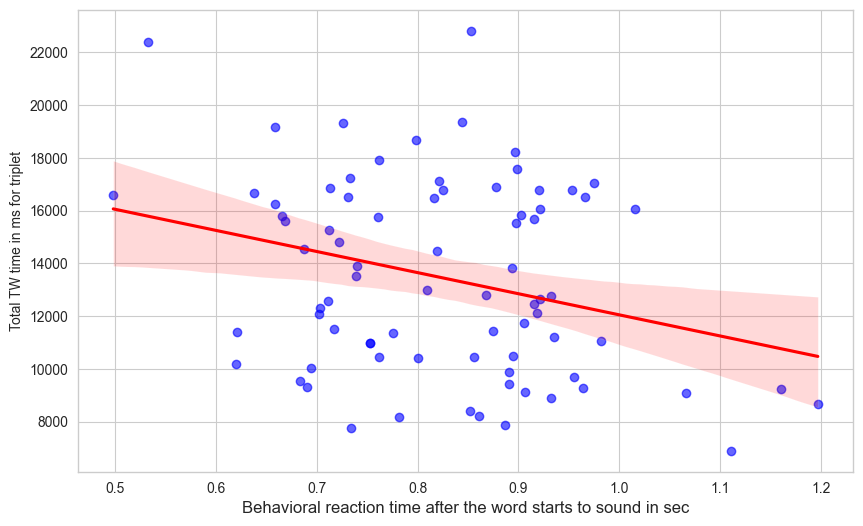

Номер триплета: 25
Испытуемый: 46
Серия: 3
Коэффициент корреляции Пирсона: 0.32
p-значение: 0.0042


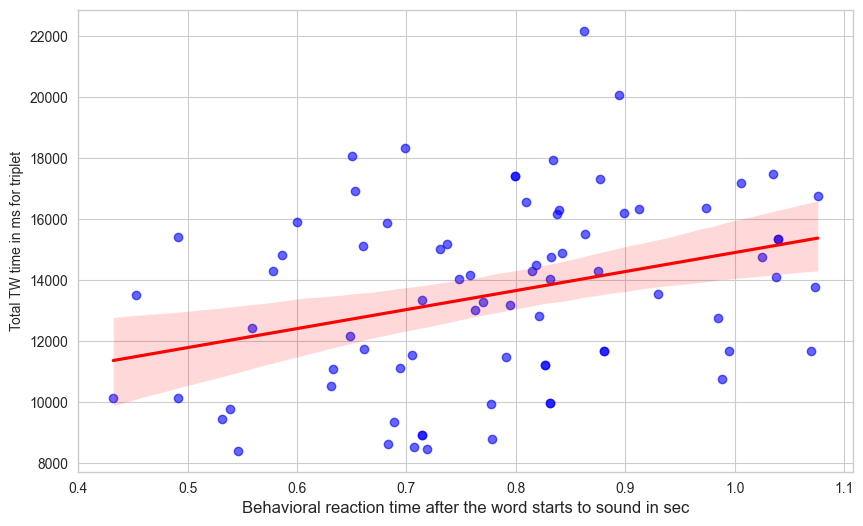

Номер триплета: 31
Испытуемый: 46
Серия: 3
Коэффициент корреляции Пирсона: -0.31
p-значение: 0.0056


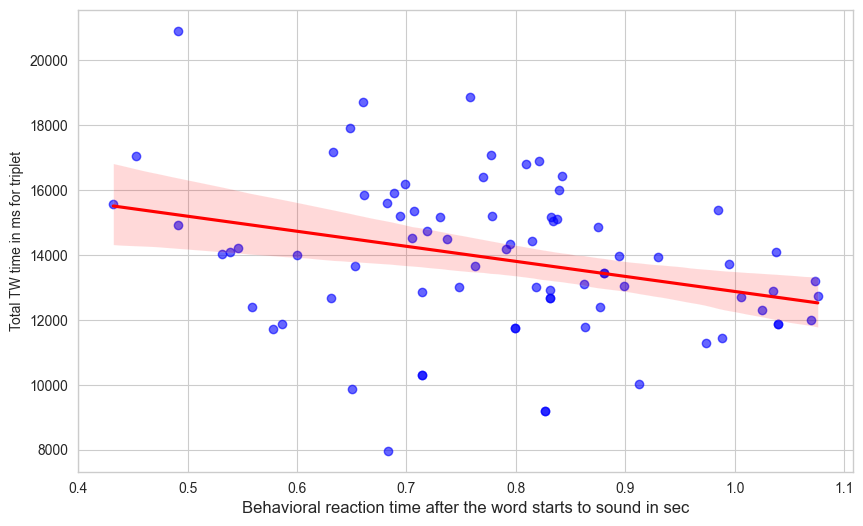

Номер триплета: 44
Испытуемый: 46
Серия: 3
Коэффициент корреляции Пирсона: -0.34
p-значение: 0.0025


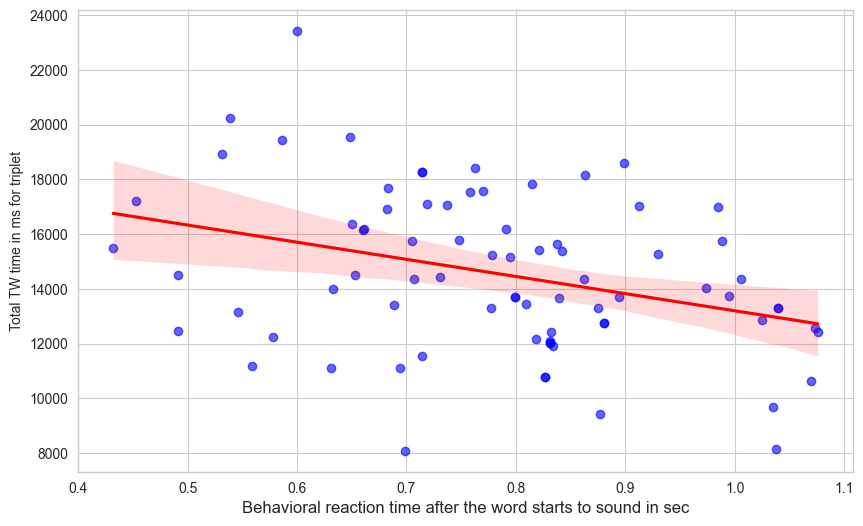

Номер триплета: 102
Испытуемый: 46
Серия: 3
Коэффициент корреляции Пирсона: -0.34
p-значение: 0.0020


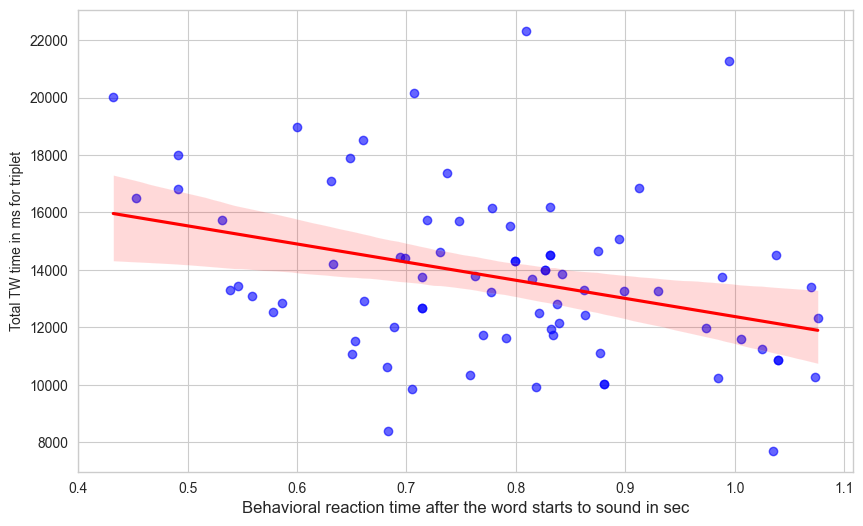

Номер триплета: 48
Испытуемый: 47
Серия: 1
Коэффициент корреляции Пирсона: -0.34
p-значение: 0.0027


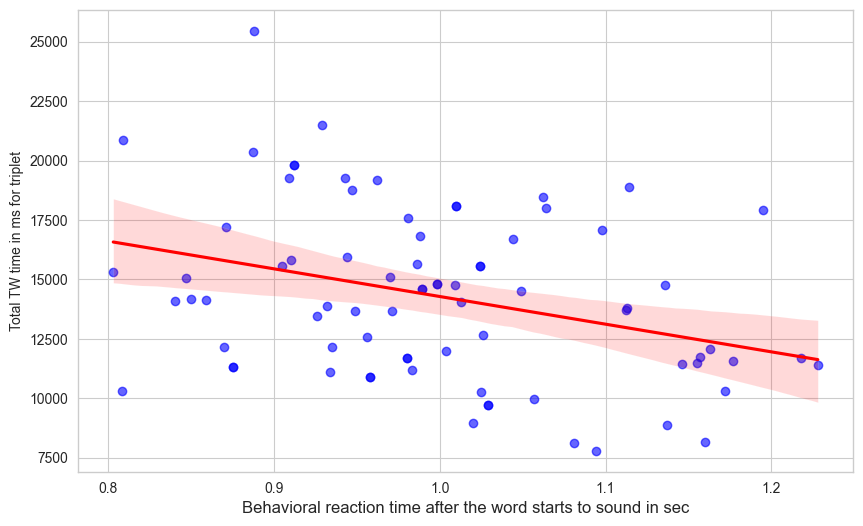

Номер триплета: 17
Испытуемый: 47
Серия: 2
Коэффициент корреляции Пирсона: -0.34
p-значение: 0.0025


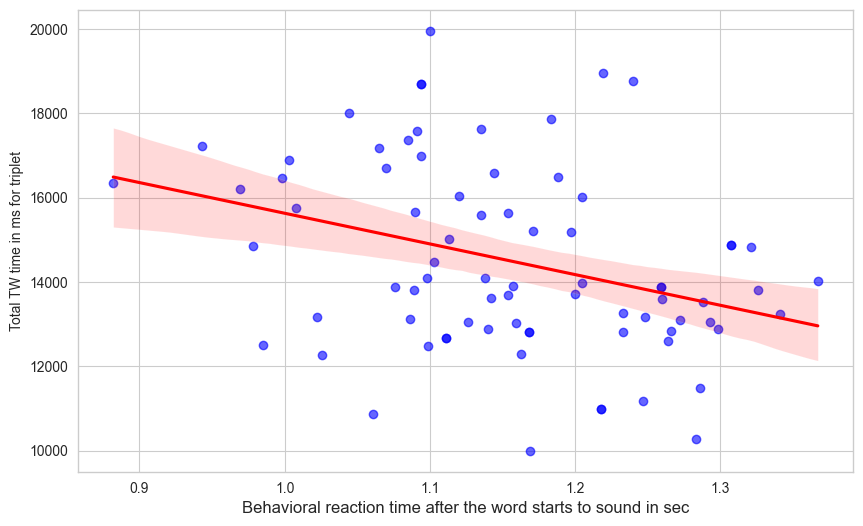

Номер триплета: 88
Испытуемый: 47
Серия: 2
Коэффициент корреляции Пирсона: 0.37
p-значение: 0.0008


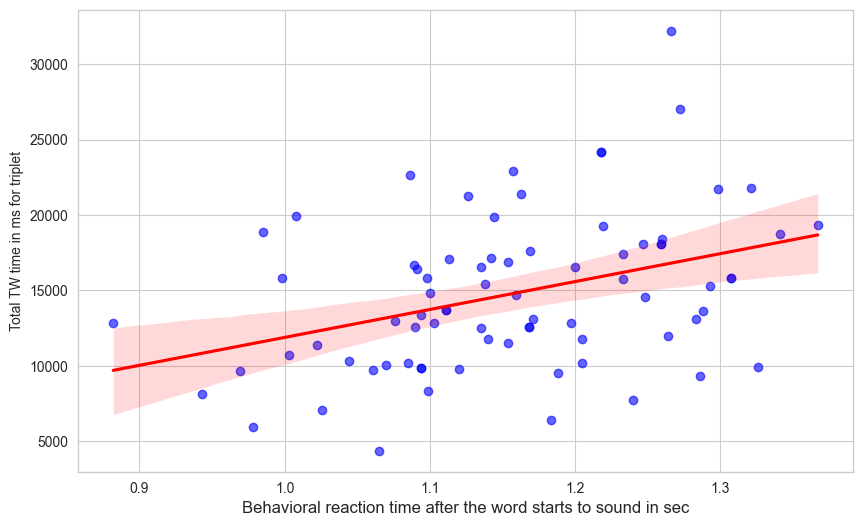

Номер триплета: 102
Испытуемый: 48
Серия: 3
Коэффициент корреляции Пирсона: 0.30
p-значение: 0.0076


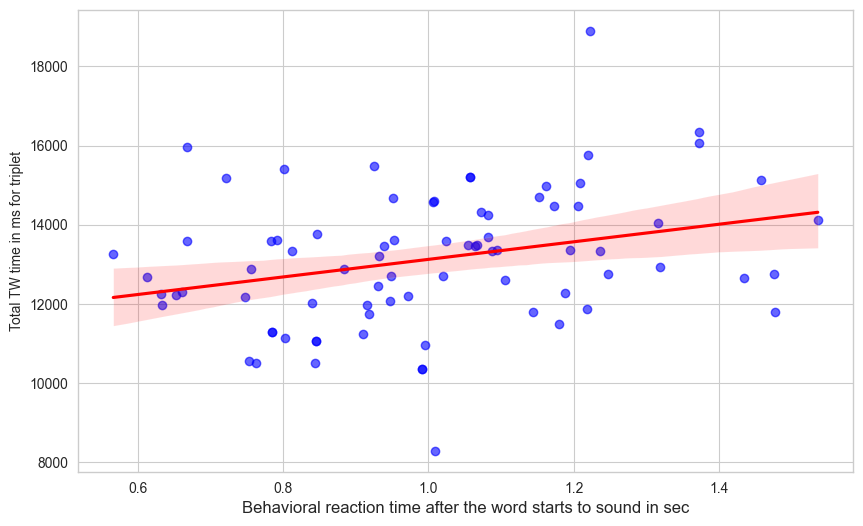

Номер триплета: 101
Испытуемый: 49
Серия: 1
Коэффициент корреляции Пирсона: 0.34
p-значение: 0.0026


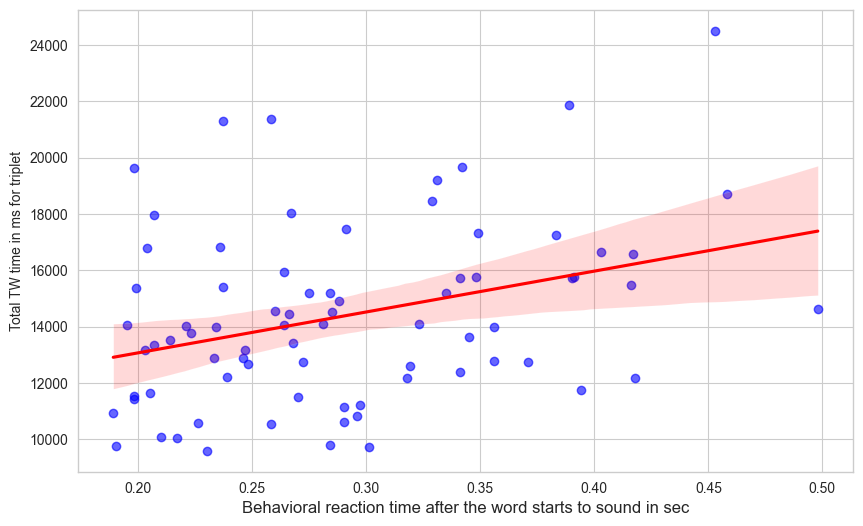

Номер триплета: 17
Испытуемый: 49
Серия: 2
Коэффициент корреляции Пирсона: 0.35
p-значение: 0.0017


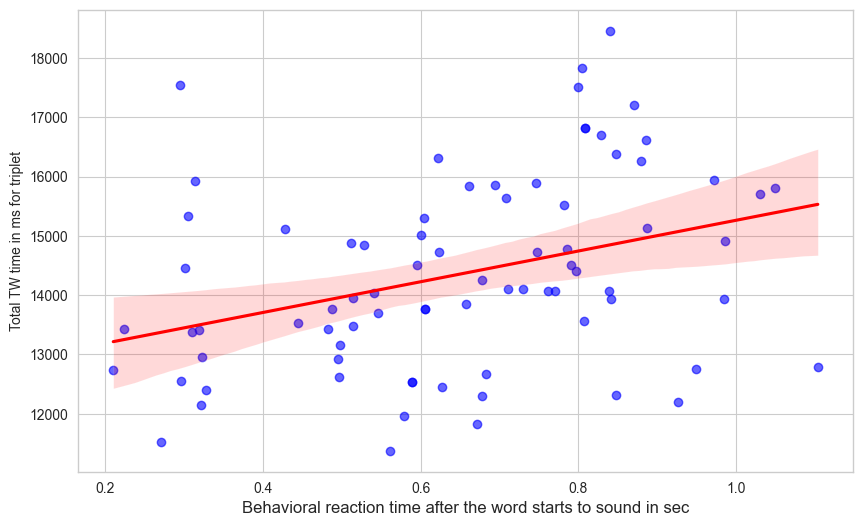

Номер триплета: 96
Испытуемый: 49
Серия: 2
Коэффициент корреляции Пирсона: 0.41
p-значение: 0.0002


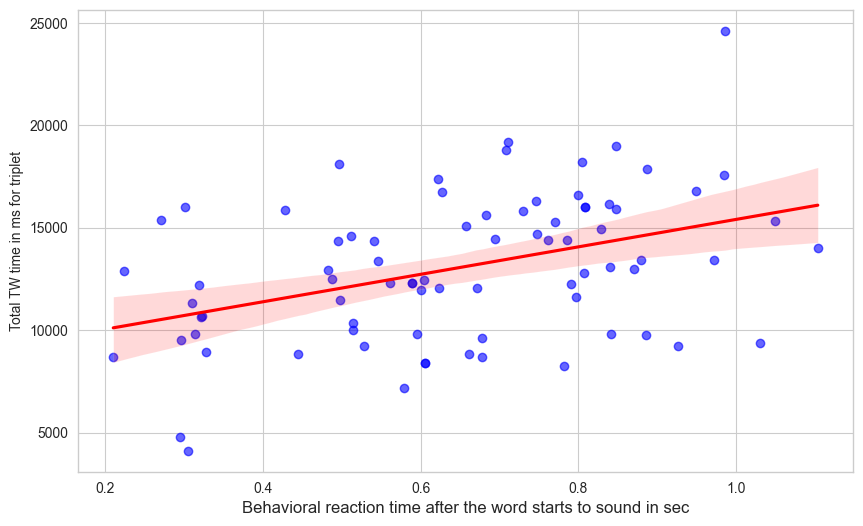

Номер триплета: 72
Испытуемый: 49
Серия: 3
Коэффициент корреляции Пирсона: 0.32
p-значение: 0.0034


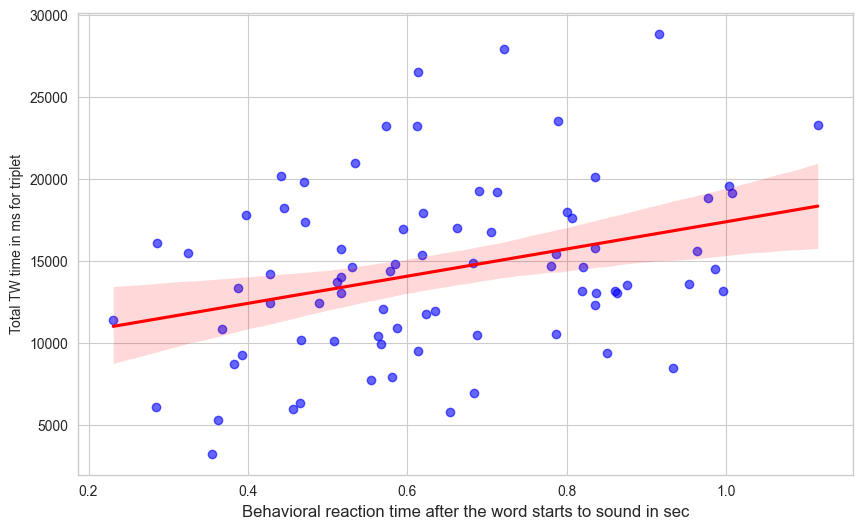

Номер триплета: 16
Испытуемый: 50
Серия: 1
Коэффициент корреляции Пирсона: 0.30
p-значение: 0.0090


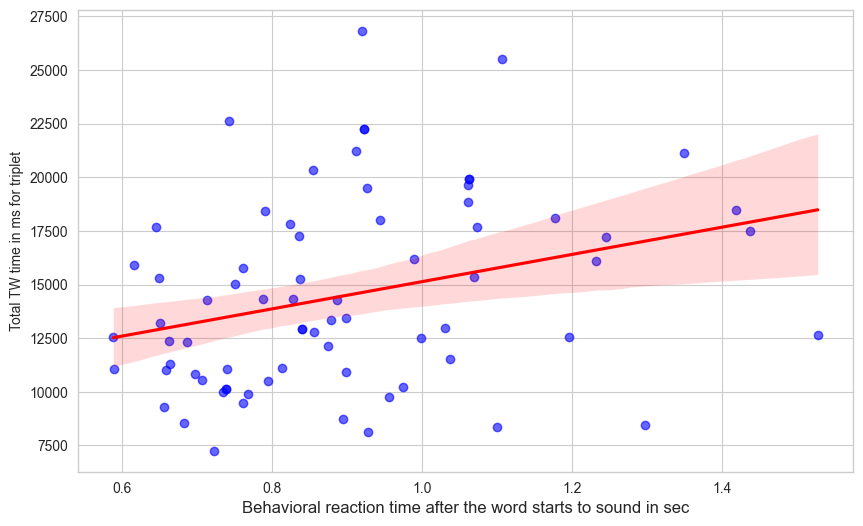

Номер триплета: 59
Испытуемый: 50
Серия: 1
Коэффициент корреляции Пирсона: -0.41
p-значение: 0.0003


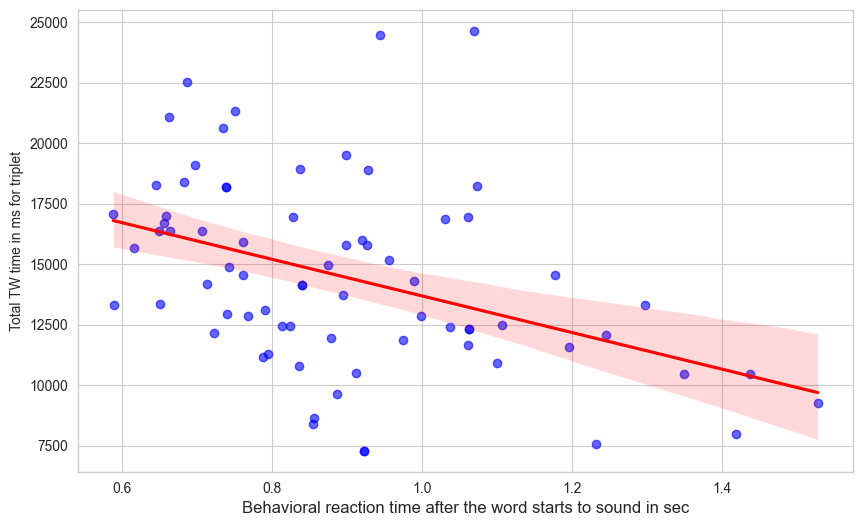

Номер триплета: 18
Испытуемый: 50
Серия: 3
Коэффициент корреляции Пирсона: -0.32
p-значение: 0.0044


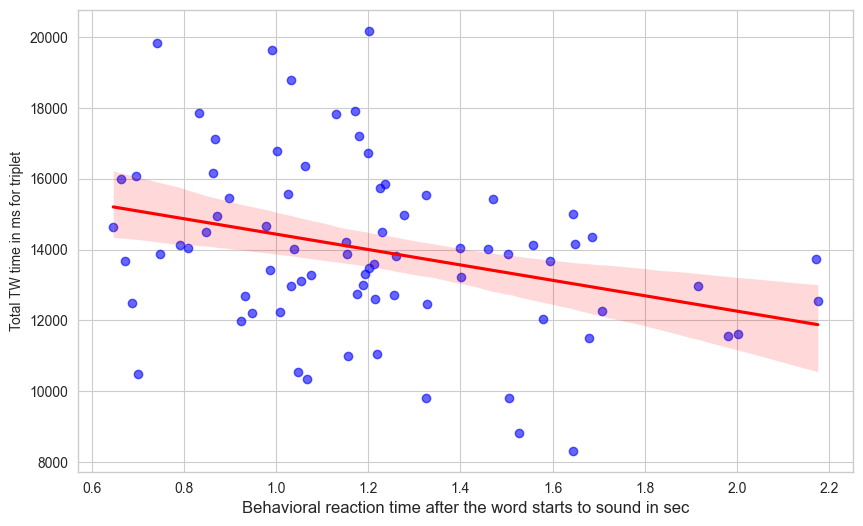

Номер триплета: 22
Испытуемый: 50
Серия: 3
Коэффициент корреляции Пирсона: 0.31
p-значение: 0.0056


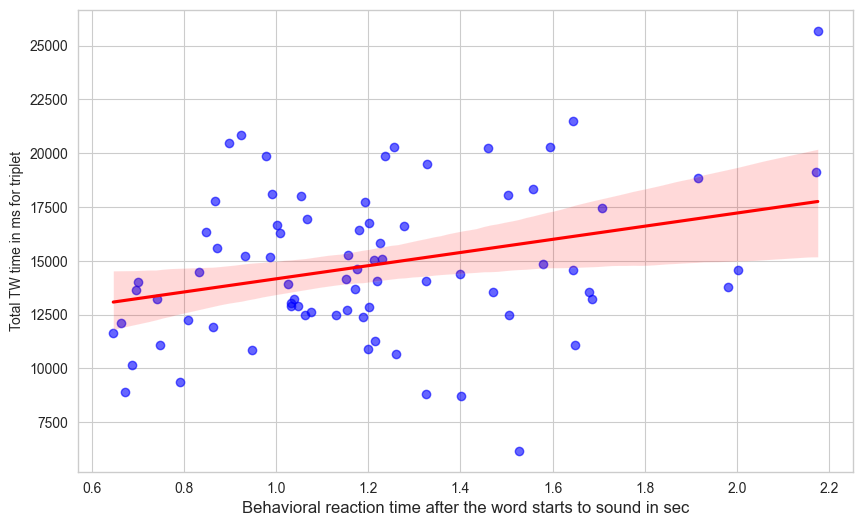

In [14]:
### Show correlation
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from scipy.io import loadmat

Nchn=102
Nser=3
sb=[21,22,23,24,25,26,27,28,33,34,35,38,39,40,41,42,43,44,45,46,47,48,49,50]
iiii=0
yyyy=np.zeros(Nchn)
iyyyy=np.zeros(Nchn)
for i in range(len(sb)):
    #print(sb[i])
    for ii in range(3):
        sr=ii+1
        nameR='data/phRw/phRw' + str(sb[i]) + '_' + str(sr) + '.mat'
        x=loadmat(nameR)['phiRw']
        values=np.squeeze(x)   # убираем скобки
        ####### Убираем выбросы методом IQR ##########################
        df = pd.DataFrame({'values': values})
        df_clean = remove_outliers_iqr(df, 'values') 
        x=values
        xc=np.squeeze(df_clean.values) # раскрываем скобки
        #print(x)     
        #print(xc)
        ##### Находим индексы сохраненных элементов в массивах нумпи #
        indices = []
        for num in xc:
            first_occurrence = np.argmax(x == num) # Ищем первое вхождение num в x
            if x[first_occurrence] == num:  # Проверяем, что элемент действительно найден
                indices.append(first_occurrence)
            else:
                indices.append(-1)
        #print("Индексы с дубликатами:", indices)  # [0, 3, 4, 5, 6]
        nameWp='data/phdp/phdp' + str(sb[i]) + '_' + str(sr) + '.mat'
        y1=loadmat(nameWp)['phdp']
        nameWm='data/phdm/phdm' + str(sb[i]) + '_' + str(sr) + '.mat'
        y2=loadmat(nameWm)['phdm']
        y=y1+y2
        yy = np.zeros((80, 102))  # Пустой массив для результатов
        for iii in range(102):
            # Берём срез для текущего i и суммируем по последней оси
            yy[:, iii] = y[:, iii, :].sum(axis=1)
            #print(yy[:,iii])
            yyy=np.zeros(len(indices))
            for j in range(len(indices)):
                yyy[j]=yy[indices[j],iii]  
            # print(yyy)
            # Вычисление корреляции
            corr_coef, p_value = pearsonr(xc, yyy)
            #print(corr_coef)
            #print(p_value)
            if p_value <= 0.01: 
               iiii=iiii+1 
               iyyyy[iiii-1]=iii 
               yyyy[iiii-1]=corr_coef
               #print(str(iiii)+','+str(sb[i])+','+str(sr)+','+f'{iii+1}'+','+f'{corr_coef:.2f}'+','+f'{p_value:.4f}')  
               # №,Subj,seria,triplet,corr_coef,p_value
            #""" визуализация    
               print(f"Номер триплета: {iii+1}")
               print(f"Испытуемый: {sb[i]}")
               print(f"Серия: {sr}")
               print(f"Коэффициент корреляции Пирсона: {corr_coef:.2f}")
               print(f"p-значение: {p_value:.4f}")
               # Построение графика
               plt.figure(figsize=(10, 6))
               sns.set_style("whitegrid")  # Стиль фона
               # Диаграмма рассеяния с линией регрессии
               #sns.regplot(x=x,y=yy[:,iii],scatter_kws={'alpha':0.6,'color':'blue'},line_kws={'color':'red'})
               sns.regplot(x=xc,y=yyy,scatter_kws={'alpha':0.6,'color':'blue'},line_kws={'color':'red'}) 
               # Настройки графика
               # plt.title(f"Корреляция между TW на {iii+1} триплете и временем реакции на услышанное слово у {sb[i]} исп. {sr} серии\nPearson r={corr_coef:.2f}, p={p_value:.4f}", fontsize=10)
               # plt.xlabel("Время реакции в мс", fontsize=12)
               plt.xlabel("Behavioral reaction time after the word starts to sound in sec", fontsize=12) 
               # plt.ylabel("Общее время TW в мс для триплета", fontsize=10)
               plt.ylabel("Total TW time in ms for triplet", fontsize=10) 
               plt.grid(True)
               plt.savefig('data/fig/corr/s'+str(sb[i])+'_'+str(sr)+'tr'+str(iii+1)+'.png')
               plt.show() 
            #"""
yyyy=yyyy[0:iiii] # Обрезаем значения корреляций
iyyyy=iyyyy[0:iiii] # Обрезаем номера триплетов                   

# Топокарта

In [15]:
import mne
import numpy as np
#from mne.datasets import sample
Nchn=102
# Загрузка примера данных
#data_path = sample.data_path()
data_path = 'mne_data/MNE-sample-data'
raw = mne.io.read_raw_fif(data_path + '/MEG/sample/sample_audvis_raw.fif', preload=True)

# Выбор только магнитометров (102 канала)
picks_mag = mne.pick_types(raw.info, meg='mag')
info_mag = mne.pick_info(raw.info, picks_mag)  # Info-объект для магнитометров

NumTri=['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', 
        '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', 
        '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', 
        '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', 
        '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', 
        '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', 
        '061', '062', '063', '064', '065', '066', '067', '068', '069', '070', 
        '071', '072', '073', '074', '075', '076', '077', '078', '079', '080', 
        '081', '082', '083', '084', '085', '086', '087', '088', '089', '090', 
        '091', '092', '093', '094', '095', '096', '097', '098', '099', '100', '101', '102']

NumTrN=['LT001', 'LF002', 'LT003', 'LT004', 'LT005', 'LT006', 'LT007', 'LT008', 'LF009', 'LF010', 
        'LF011', 'LF012', 'LT013', 'LС014', 'LС015', 'LT016', 'LF017', 'LF018', 'LF019', 'LF020', 
        'LF021', 'ZF022', 'LС023', 'LF024', 'LC025', 'RC026', 'RС027', 'LС028', 'ZF029', 'ZF030', 
        'RF031', 'RF032', 'RF033', 'RF034', 'ZF035', 'RF036', 'RF037', 'RC038', 'RС039', 'RT040', 
        'RT041', 'RС042', 'RF043', 'RF044', 'RF045', 'RF046', 'RT047', 'RT048', 'RT049', 'RT050', 
        'RF051', 'RT052', 'RT053', 'RT054', 'LT055', 'LT056', 'LT057', 'LT058', 'LT059', 'LT060', 
        'LP061', 'LO062', 'LO063', 'LO064', 'LO065', 'LO066', 'LT067', 'LС068', 'LP069', 'LP070', 
        'LO071', 'LO072', 'LO073', 'LO074', 'LP075', 'RP076', 'RO077', 'LO078', 'ZO079', 'ZO080', 
        'RO081', 'LO082', 'RС083', 'RT084', 'RP085', 'RP086', 'RO087', 'RO088', 'RO089', 'RO090', 
        'RT091', 'RT092', 'RO093', 'RT094', 'RO095', 'RO096', 'RO097', 'RO098', 'RT099', 'RT100', 
        'RT101', 'RT102']
# L - left R - right Z - sagital F - frontal C - central T - temporal P - parietal O - occipital    

Opening raw data file mne_data/MNE-sample-data/MEG/sample/sample_audvis_raw.fif...
    Read a total of 3 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
    Range : 25800 ... 192599 =     42.956 ...   320.670 secs
Ready.
Reading 0 ... 166799  =      0.000 ...   277.714 secs...


In [16]:
# Перегружаем значения корреляций в массив для картирования (отрицательные значения)
Nchn=102
Tmap=np.zeros(Nchn)
for i in range(len(yyyy)):
    if Tmap[int(iyyyy[i])]==0 and yyyy[i]<0:
       Tmap[int(iyyyy[i])]=yyyy[i] 
    elif Tmap[int(iyyyy[i])]<0 and yyyy[i]<0:    
       Tmap[int(iyyyy[i])]=Tmap[int(iyyyy[i])]+yyyy[i] 
Tmap1=Tmap
#print(Tmap)

In [17]:
# Перегружаем значения корреляций в массив для картирования (положительные значения)
Nchn=102
Tmap=np.zeros(Nchn)
for i in range(len(yyyy)):
    if Tmap[int(iyyyy[i])]==0 and yyyy[i]>0:
       Tmap[int(iyyyy[i])]=yyyy[i]
    elif Tmap[int(iyyyy[i])]>0 and yyyy[i]>0:    
       Tmap[int(iyyyy[i])]=Tmap[int(iyyyy[i])]+yyyy[i] 
Tmap2=Tmap
m=np.max(Tmap)
Tmap2=Tmap-m+0.8        
print(Tmap2)

[-0.43850416 -0.43850416 -0.43850416 -0.06602661 -0.43850416 -0.43850416
 -0.43850416 -0.43850416 -0.43850416  0.02655633 -0.43850416 -0.43850416
 -0.09508842 -0.43850416 -0.43850416  0.16597818 -0.09137588 -0.43850416
 -0.10738952 -0.43850416 -0.43850416 -0.12783676 -0.43850416 -0.43850416
 -0.11768361 -0.43850416 -0.13306527 -0.09317672 -0.11540248 -0.43850416
 -0.14851073 -0.43850416 -0.43850416 -0.43850416 -0.43850416 -0.10578319
 -0.10766631 -0.43850416  0.00145827  0.16400563 -0.13513187  0.2137874
 -0.06501473 -0.43850416 -0.43850416 -0.43850416 -0.43850416 -0.43850416
 -0.43850416 -0.43850416 -0.43850416 -0.43850416 -0.43850416 -0.43850416
 -0.43850416 -0.43850416 -0.43850416 -0.05411223 -0.07735167 -0.43850416
 -0.43850416 -0.10986132 -0.43850416 -0.08056013 -0.14258785 -0.11403037
 -0.10398271 -0.11761573 -0.13901782 -0.43850416 -0.43850416  0.8
 -0.43850416 -0.43850416 -0.12919273 -0.43850416 -0.43850416 -0.01582755
 -0.06821736 -0.43850416 -0.43850416 -0.43850416 -0.1520036

In [18]:
# Перегружаем значения корреляций в массив для картирования (+/- значения)
Nchn=102
Tmap=np.zeros(Nchn)
for i in range(len(yyyy)):
    if Tmap[int(iyyyy[i])]==0:
       Tmap[int(iyyyy[i])]=yyyy[i]
    else:    
       Tmap[int(iyyyy[i])]=Tmap[int(iyyyy[i])]+yyyy[i] 
Tmap3=Tmap

In [19]:
print(Tmap2)

[-0.43850416 -0.43850416 -0.43850416 -0.06602661 -0.43850416 -0.43850416
 -0.43850416 -0.43850416 -0.43850416  0.02655633 -0.43850416 -0.43850416
 -0.09508842 -0.43850416 -0.43850416  0.16597818 -0.09137588 -0.43850416
 -0.10738952 -0.43850416 -0.43850416 -0.12783676 -0.43850416 -0.43850416
 -0.11768361 -0.43850416 -0.13306527 -0.09317672 -0.11540248 -0.43850416
 -0.14851073 -0.43850416 -0.43850416 -0.43850416 -0.43850416 -0.10578319
 -0.10766631 -0.43850416  0.00145827  0.16400563 -0.13513187  0.2137874
 -0.06501473 -0.43850416 -0.43850416 -0.43850416 -0.43850416 -0.43850416
 -0.43850416 -0.43850416 -0.43850416 -0.43850416 -0.43850416 -0.43850416
 -0.43850416 -0.43850416 -0.43850416 -0.05411223 -0.07735167 -0.43850416
 -0.43850416 -0.10986132 -0.43850416 -0.08056013 -0.14258785 -0.11403037
 -0.10398271 -0.11761573 -0.13901782 -0.43850416 -0.43850416  0.8
 -0.43850416 -0.43850416 -0.12919273 -0.43850416 -0.43850416 -0.01582755
 -0.06821736 -0.43850416 -0.43850416 -0.43850416 -0.1520036

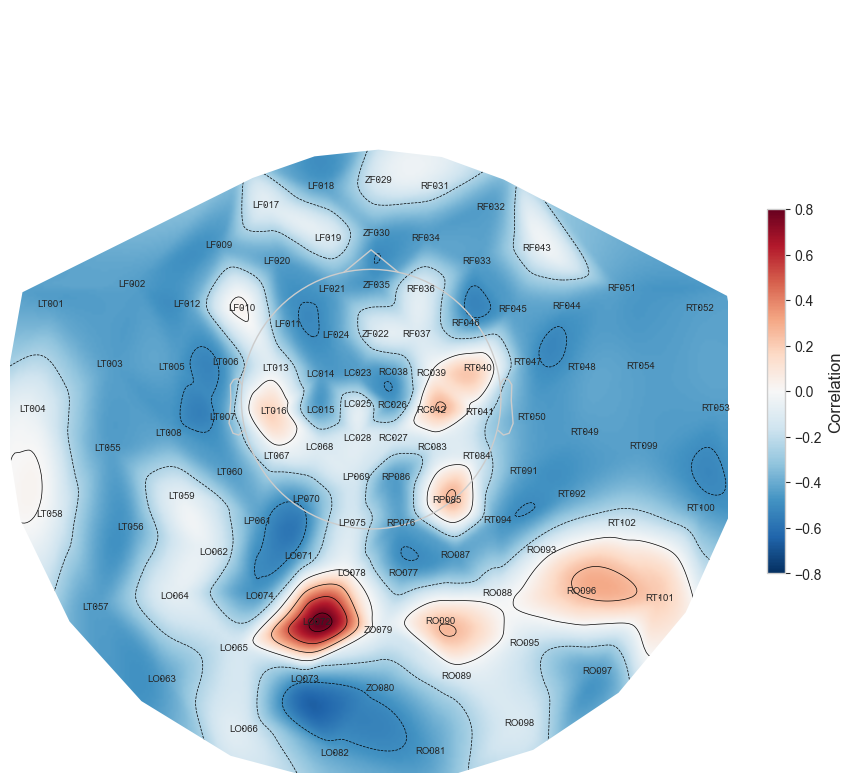

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import mne

# Создаем топокарту
fig, ax = plt.subplots()  # Создаем фигуру и оси для контроля
#fig, ax = plt.subplots(figsize=(7, 5))

im = mne.viz.plot_topomap(
    data=Tmap2, 
    pos=info_mag,          # Информация о расположении датчиков
    names=NumTrN, #info_mag['ch_names'],  # Используем правильные имена каналов
    cmap='RdBu_r',
    size=7,
    res=300,
    show=False,            # Не показываем сразу, чтобы добавить цветовую шкалу
    outlines='head',
    sensors=True,
    contours=5,
    image_interp='cubic',
    axes=ax                # Используем созданные оси
)

# mne.viz.plot_topomap(data, pos=info_mag, axes=ax, **common_params)
# Добавляем компактную цветовую шкалу
#cbar = fig.colorbar(im[0], ax=ax, fraction=0.04, pad=0.04)
#cbar.set_label('Амплитуда')
# Высота шкалы = 70% высоты карты
height_ratio = 0.5
cbar = fig.colorbar(im[0], ax=ax, fraction=0.047*height_ratio)
cbar.set_label('Correlation')
fig.set_size_inches(10, 10)
plt.show()
# 6. Сохранение в файл
fig.savefig('data/fig/map/topomap1.png', dpi=300, bbox_inches='tight')
plt.close(fig)

Opening raw data file mne_data/MNE-sample-data/MEG/sample/sample_audvis_raw.fif...
    Read a total of 3 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
    Range : 25800 ... 192599 =     42.956 ...   320.670 secs
Ready.
Reading 0 ... 166799  =      0.000 ...   277.714 secs...
['Negative', 'Positive', 'Combined']


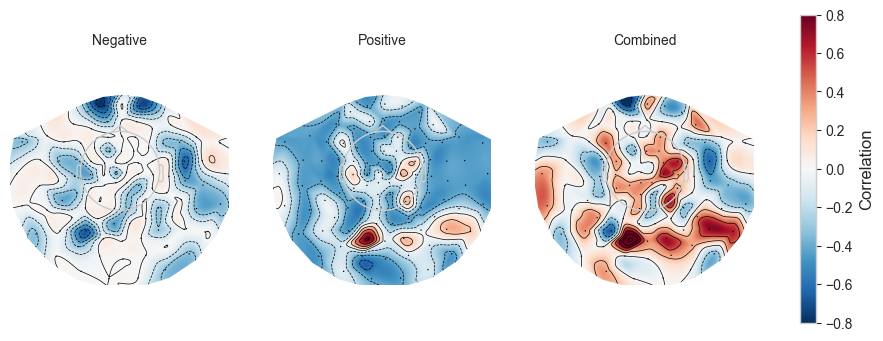

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import mne
#"""
# 1. Загрузка данных и подготовка
data_path = 'mne_data/MNE-sample-data'
raw = mne.io.read_raw_fif(data_path + '/MEG/sample/sample_audvis_raw.fif', preload=True)
picks_mag = mne.pick_types(raw.info, meg='mag')
info_mag = mne.pick_info(raw.info, picks_mag)
#"""
# 2. Генерация 6 разных наборов данных
# np.random.seed(42)
# datasets = [np.random.randn(len(picks_mag)) for _ in range(6)]
# Загрузка данных
datasets = [Tmap1, Tmap2, Tmap3]
titles = [f'Condition {i+1}' for i in range(3)]
#titles = ['Отрицательная', 'Положительная', 'Суммарная']
titles = ['Negative', 'Positive', 'Combined']
#print(datasets)
print(titles)
#"""
# 3. Создание сетки графиков 1x3
fig, axes = plt.subplots(1, 3, figsize=(12, 8))
fig.subplots_adjust(hspace=0.4, wspace=0.2)

# 4. Параметры для plot_topomap
common_params = {
    'cmap': 'RdBu_r',
    'sensors': True,
    'res': 300,
    'outlines': 'head',
    'contours': 8,
    'size': 8,
    'image_interp': 'cubic',
    'show': False,
    'vlim': (-0.8, 0.8)  # Фиксированный масштаб для всех карт
}

# 5. Заполнение сетки
for i, (data, ax, title) in enumerate(zip(datasets, axes.ravel(), titles)):
    mne.viz.plot_topomap(data, pos=info_mag, axes=ax, **common_params)
    ax.set_title(title, fontsize=10)
    # Добавление цветовой шкалы только для первого графика
    if i == 0:
        im = ax.images[0]
        cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.5)
        cbar.set_label('Correlation')
plt.show()
# 6. Сохранение в файл
fig.savefig('data/fig/map/topomap_grid.png', dpi=300, bbox_inches='tight')
plt.close(fig)